<span style="color:blue">

# Stock Data

</span>

## Libraries

In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import yfinance as yf
import datetime
import openpyxl
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
from tqdm import tqdm

## Import Data

In [2]:
# # # tickers = ['AMD', 'MSFT', 'IBM', 'INTC', 'QCOM', 
# # #            'ARM', 'STM', 'ADI', 'TSM', 'GOOGL', 'AAPL', 
# # #            'AMZN', 'JPM', 'ORCL', 'UBER', 'LYFT', 'HPQ', 
# # #            'SQ', 'SHOP', 'SNAP', 'DOCU', 'ZM', 'SPOT', 'OKTA', 'DDOG', 'EA', 'TTWO', 'CDNS', 
# # #            'ANSS', 'SNPS', 'FTNT', 'CHKP', 'PANW', 'ZS', 'CRWD', 'NET',
# # #            'GLD', 'SLV', 'CL=F', 'NG', 'CORN', 'ZW=F', 'SB=F', 'KC=F', 'HG=F',
# # #            'TSLA', 'NVDA', 'BABA', 'PYPL', 'NFLX', 'GS', 'CSCO', 'BAC', 'CVX', 'XOM']
# # tickers = ['AMD', 'MSFT', 'IBM', 'INTC', 'QCOM', 
# #           'ARM', 'STM', 'ADI', 'TSM', 'GOOGL', 'AAPL', 
# #           'AMZN', 'JPM', 'ORCL', 'UBER', 'LYFT', 'HPQ', 
# #           'SQ', 'SHOP', 'SNAP', 'DOCU', 'ZM', 'SPOT', 'OKTA', 'DDOG', 'EA', 'TTWO', 'CDNS', 
# #           'ANSS', 'SNPS', 'FTNT', 'CHKP', 'PANW', 'ZS', 'CRWD', 'NET']
# tickers = ['SPY']

# def ticker_data(ticker):
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore")
#         DATA = yf.download(ticker, period='4y', interval='1d')['Close']
#         # DATA = DATA.resample('4H').mean() # reagrupar em 4horas

#         return DATA

# # Get ticker data and drop 'Datetime' column

# data.to_csv('spy.csv')
# # differenced_data = data.diff().dropna() # tive de diferenciar os dados para os tornar estacionários

# # # Transpose the data and reset the index
# # data_transposed = differenced_data.transpose().reset_index()


# load data

In [3]:
prices = pd.read_csv('sp500.csv', delimiter = ';')
benchmark = pd.read_csv('spy.csv', delimiter = ',')
benchmark = benchmark.drop('Unnamed: 0', axis=1)

#get tickers list
stocks = prices.columns.tolist()
stocks = stocks[1:]

# Convert 'Date' to datetime 
prices['Date'] = pd.to_datetime(prices['Date'], format='%d/%m/%y')

benchmark['Date'] = pd.to_datetime(benchmark['Date'], format='%Y-%m-%d')
# Set 'Date' as the index
prices = prices.set_index('Date')
prices.index.name = None

benchmark = benchmark.set_index('Date')
benchmark.index.name = None

#check for nan values
has_nans = prices.isna().any().any()
print('Do I have NaNs in the dataframe?', has_nans)

Do I have NaNs in the dataframe? False


## define dictionary for tickers real names

In [4]:
labels = pd.read_csv('SP_500_Companies_list.csv', delimiter = ',')
labels_dict = dict(zip(labels['Symbol'], labels['Name']))
labels_dict

{'MMM': '3M Co.',
 'ACE': 'ACE Limited',
 'ABT': 'Abbott Laboratories',
 'ANF': 'Abercrombie & Fitch Company A',
 'ACN': 'Accenture',
 'ADBE': 'Adobe Systems Inc',
 'AMD': 'Advanced Micro Devices',
 'AES': 'AES Corp',
 'AET': 'Aetna Inc',
 'AFL': 'AFLAC Inc',
 'A': 'Agilent Technologies Inc',
 'GAS': 'AGL Resources Inc.',
 'APD': 'Air Products & Chemicals Inc',
 'ARG': 'Airgas Inc',
 'AKAM': 'Akamai Technologies Inc',
 'AA': 'Alcoa Inc',
 'ALXN': 'Alexion Pharmaceuticals',
 'ATI': 'Allegheny Technologies Inc',
 'AGN': 'Allergan Inc',
 'ALL': 'Allstate Corp',
 'ANR': 'Alpha Natural Resources',
 'ALTR': 'Altera Corp',
 'MO': 'Altria Group Inc',
 'AMZN': 'Amazon.com Inc',
 'AEE': 'Ameren Corp',
 'AEP': 'American Electric Power',
 'AXP': 'American Express Co',
 'AIG': 'American Intl Group Inc',
 'AMT': 'American Tower Corp A',
 'AMP': 'Ameriprise Financial',
 'ABC': 'AmerisourceBergen Corp',
 'AMGN': 'Amgen Inc',
 'APH': 'Amphenol Corp A',
 'APC': 'Anadarko Petroleum Corp',
 'ADI': 'Analog

In [5]:
prices

,A,AA,AAPL,ABT,ACN,ADBE,ADI,ADM,ADP,ADSK,...,WY,WYNN,X,XEL,XOM,XRAY,XRX,XYL,YUM,ZION
2020-04-13,76.209999,7.550000,68.312500,85.849998,172.570007,320.649994,99.669998,36.070000,139.529999,160.919998,...,20.100000,69.300003,6.800000,63.660000,42.759998,40.240002,18.190001,68.190002,77.059998,30.080000
2020-04-14,78.830002,7.720000,71.762497,89.139999,178.100006,340.769989,103.019997,37.240002,143.869995,172.220001,...,20.330000,74.480003,6.860000,66.250000,42.430000,40.759998,19.000000,70.400002,79.889999,29.540001
2020-04-15,77.050003,7.260000,71.107498,90.940002,169.449997,332.549988,100.449997,35.490002,137.639999,169.139999,...,19.120001,71.849998,6.550000,64.300003,40.480000,39.950001,17.270000,67.120003,77.639999,28.010000
2020-04-16,78.750000,6.960000,71.672501,96.000000,167.949997,342.700012,101.830002,35.660000,136.919998,171.000000,...,18.969999,72.290001,6.510000,65.250000,39.150002,39.080002,16.910000,66.580002,80.110001,26.940001
2020-04-17,79.550003,7.590000,70.699997,96.010002,175.089996,344.109985,102.800003,37.189999,141.080002,180.940002,...,20.100000,78.459999,6.790000,67.150002,43.220001,40.860001,18.120001,69.589996,84.169998,29.080000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-08,144.460007,36.340000,168.449997,110.519997,331.799988,484.279999,196.690002,63.180000,246.639999,245.889999,...,34.419998,105.989998,40.549999,54.080002,120.550003,32.240002,17.230000,127.750000,135.220001,42.990002
2024-04-09,147.399994,36.820000,169.669998,112.440002,334.450012,492.549988,204.119995,63.900002,250.009995,247.929993,...,35.029999,106.489998,41.930000,54.369999,121.180000,32.849998,17.430000,128.929993,137.020004,43.509998
2024-04-10,144.160004,36.189999,167.779999,111.169998,324.399994,487.220001,196.330002,63.889999,245.789993,239.009995,...,33.599998,104.239998,42.610001,53.750000,122.199997,32.389999,16.889999,128.190002,137.949997,41.090000
2024-04-11,145.000000,36.230000,175.039993,111.449997,325.190002,484.279999,198.639999,62.570000,244.419998,241.059998,...,33.650002,104.860001,42.230000,53.490002,121.790001,32.020000,17.240000,128.789993,138.330002,41.259998


# Split the data between train and test

In [6]:
# Calculate the percentage change from the previous row for each row in the DataFrame
returns = prices.pct_change().dropna()
returns_benchmark = benchmark.pct_change().dropna()

#Train -Test Split 50-50
returns_train = returns.loc[:'2022-04-13']
prices_train = prices.loc[returns_train.index]

#extract train labels
stocks_train = prices_train.columns.tolist()
stocks_train = stocks_train[0:]

# Select all the rows in the returns DataFrame from the date '2022-04-14' onwards
returns_test = returns.loc['2022-04-14':]
prices_test = prices.loc[returns_test.index]

benchmark_test = returns_benchmark.loc['2022-04-14':]
returns_benchmart = benchmark.loc[benchmark_test.index]

#extract test  labels
stocks_test = prices_train.columns.tolist()
stocks_test = stocks_test[1:]

In [7]:
prices_transposed = prices_train.diff().dropna() # differentiate the data to make it stationary
prices_transposed = prices_transposed.transpose().reset_index() # transpose the data and reset the index
prices_transposed = prices_transposed.drop('index', axis=1) # drop the 'index' column
prices_transposed.tail() # display the last few rows


,2020-04-15,2020-04-16,2020-04-17,2020-04-20,2020-04-21,2020-04-22,2020-04-23,2020-04-24,2020-04-27,2020-04-28,...,2022-03-31,2022-04-01,2022-04-04,2022-04-05,2022-04-06,2022-04-07,2022-04-08,2022-04-11,2022-04-12,2022-04-13
354,-0.809998,-0.869999,1.779999,0.419998,-1.619999,0.250000,-1.209999,0.610001,1.789997,0.530003,...,-0.329998,0.029999,-0.570000,-0.049999,-0.360001,-0.200001,-0.020000,0.430000,-0.029999,0.299999
355,-1.730000,-0.360001,1.210001,-0.290001,-1.059999,0.320000,0.299999,0.580000,-0.150000,-0.080000,...,-0.289999,-0.200001,-0.469999,-0.250000,-0.230000,0.359999,-0.189999,0.230000,-0.430000,0.300001
356,-3.279999,-0.540001,3.009995,-0.329994,-1.180000,1.099998,-1.180000,0.519997,2.250000,2.690002,...,-2.839996,0.970001,0.529999,0.129997,-0.180000,0.010002,-0.050003,-0.939995,-0.880005,1.690002
357,-2.250000,2.470001,4.059998,-2.099998,-0.870003,5.590004,-1.180000,0.279999,2.300003,0.079994,...,-2.309997,0.290001,-1.120003,-0.059998,0.980003,1.779999,-1.230003,-0.860001,1.580002,1.980003
358,-1.530001,-1.070000,2.139999,0.190001,-0.620001,0.250000,0.290001,0.269999,1.330002,0.539999,...,-1.810005,-1.259995,-0.200005,0.300003,-0.730003,-0.489998,0.709999,0.340004,-1.010002,0.799995


<Axes: title={'center': 'Apple Stock Non Stationary'}>

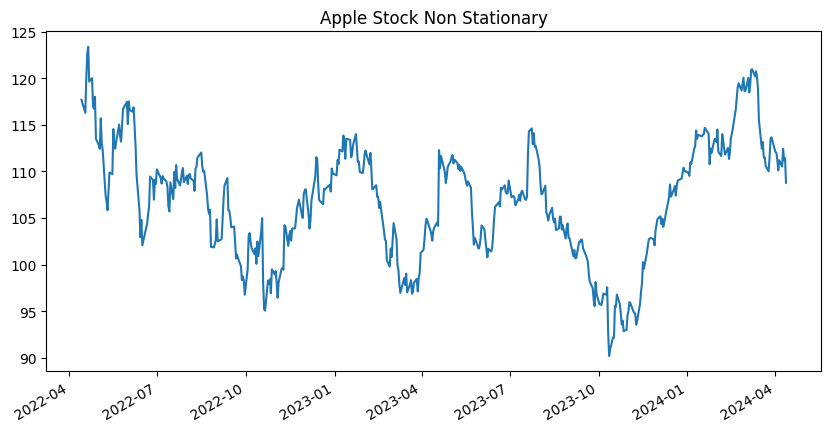

In [8]:
prices_test.iloc[:, 3].plot(kind='line', figsize=(10, 5), title='Apple Stock Non Stationary')

<Axes: title={'center': 'Apple Stock Stationary'}>

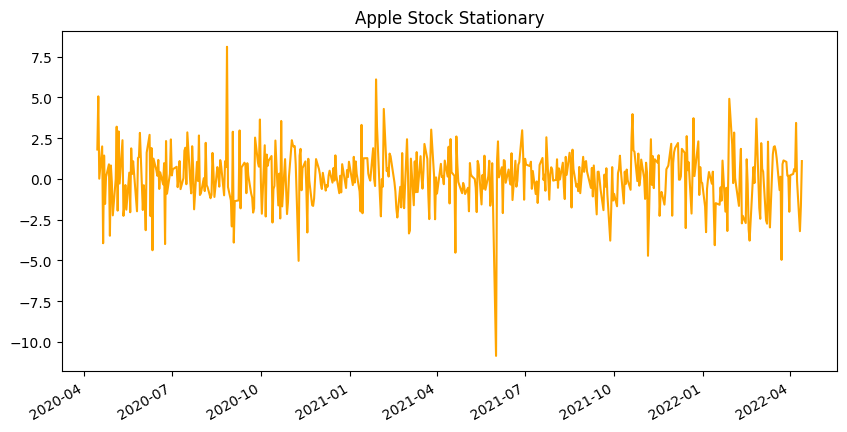

In [9]:
prices_transposed.iloc[3, :].plot(kind='line', figsize=(10, 5), title='Apple Stock Stationary', color ='orange')

<Axes: title={'center': 'S&P 500 Benchmark'}>

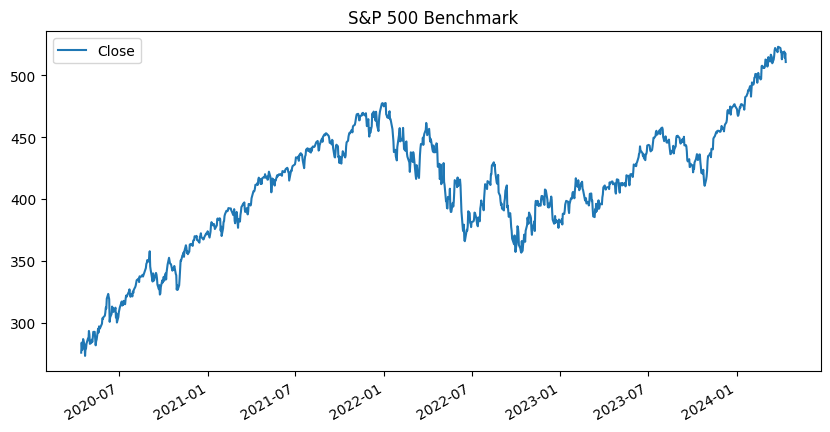

In [10]:
# SP 500 cumulative returns for the period. we will use this to benchmark our strategy.
benchmark.plot(kind='line', figsize=(10, 5), title='S&P 500 Benchmark',)

# Prepare df shape for PCA

In [11]:
# Normalizing data
prices_transposed = StandardScaler().fit_transform(prices_transposed)

In [12]:
prices_transposed.shape
# shape (values, tickers)

(359, 505)

# Apply PCA

In [13]:
pca = PCA(n_components=85)

principalComponents = pca.fit_transform(prices_transposed)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component ' + str(i) for i in range(1, 86)])


In [14]:
principalDf

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10,...,principal component 76,principal component 77,principal component 78,principal component 79,principal component 80,principal component 81,principal component 82,principal component 83,principal component 84,principal component 85
0,1.692049,-2.586806,-0.020036,-4.511346,-0.543968,-2.051308,0.888732,-3.084973,0.624609,-1.080439,...,-0.744707,0.106328,0.852995,0.493233,-0.406655,-0.232852,-0.794404,-0.254650,0.189153,0.667687
1,-4.259906,-1.862524,-0.782223,1.681081,2.091710,1.498877,1.177558,-0.685188,0.612822,-0.557724,...,-0.716768,-0.607530,1.609311,0.574508,0.055331,-0.373376,-0.083935,0.154564,0.634380,1.004294
2,4.295147,-4.225312,-0.046454,-5.660427,0.371119,0.346051,-0.698194,0.048091,-0.391730,1.147882,...,1.190539,0.714894,1.186709,-0.845096,1.683397,-0.408465,-0.096989,0.850971,-0.642172,0.052607
3,-1.020878,-2.604676,-1.904939,-5.380888,-2.834182,-3.254240,1.291221,-1.944141,1.649384,0.297869,...,-0.155851,-0.345921,-0.264278,-1.094989,-0.493931,-0.022084,-1.095282,0.483593,0.543613,-0.810270
4,11.311624,1.788140,3.823823,-3.437834,-7.992266,-0.846150,-3.370594,-2.411126,-1.175143,1.855488,...,-1.170102,1.080488,-0.283168,-1.343382,0.110044,0.013110,-0.442696,-0.567537,-0.852177,0.014624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354,-4.042056,-0.481772,-1.208913,0.418875,0.490181,-0.618252,0.276088,0.148820,0.521698,1.046321,...,-0.514125,0.059242,0.361122,0.034242,0.291789,-0.281212,0.545954,0.196119,-0.362500,0.335871
355,-4.400729,-1.842849,-2.222986,0.131628,1.498866,0.162535,0.025117,-0.281216,-0.070147,0.574492,...,-0.337589,-0.102933,-0.285609,-0.026221,-0.188455,-0.295617,0.025507,0.233138,-0.057852,-0.118081
356,-0.611223,1.038823,0.477480,1.725384,-0.416749,-0.515333,0.716005,-1.623644,-1.672932,-1.432741,...,1.182322,0.220762,0.286227,-0.088125,-0.747514,-0.119324,-0.668792,-0.202904,-0.633243,-0.318366
357,-0.550296,-0.527916,-3.049196,1.081626,0.272270,-0.728589,-1.073969,-0.142443,-1.536255,0.667055,...,0.871365,1.297783,-0.338935,0.842974,0.833363,0.519229,-0.123660,0.225519,-0.487395,0.139525


Principal Component 1: 22.94% of the variance is explained
Principal Component 2: 35.42% of the variance is explained
Principal Component 3: 42.95% of the variance is explained
Principal Component 4: 49.42% of the variance is explained
Principal Component 5: 53.60% of the variance is explained
Principal Component 6: 56.68% of the variance is explained
Principal Component 7: 58.81% of the variance is explained
Principal Component 8: 60.86% of the variance is explained
Principal Component 9: 62.57% of the variance is explained
Principal Component 10: 64.17% of the variance is explained
Principal Component 11: 65.60% of the variance is explained
Principal Component 12: 67.00% of the variance is explained
Principal Component 13: 68.25% of the variance is explained
Principal Component 14: 69.37% of the variance is explained
Principal Component 15: 70.37% of the variance is explained
Principal Component 16: 71.29% of the variance is explained
Principal Component 17: 72.11% of the variance is

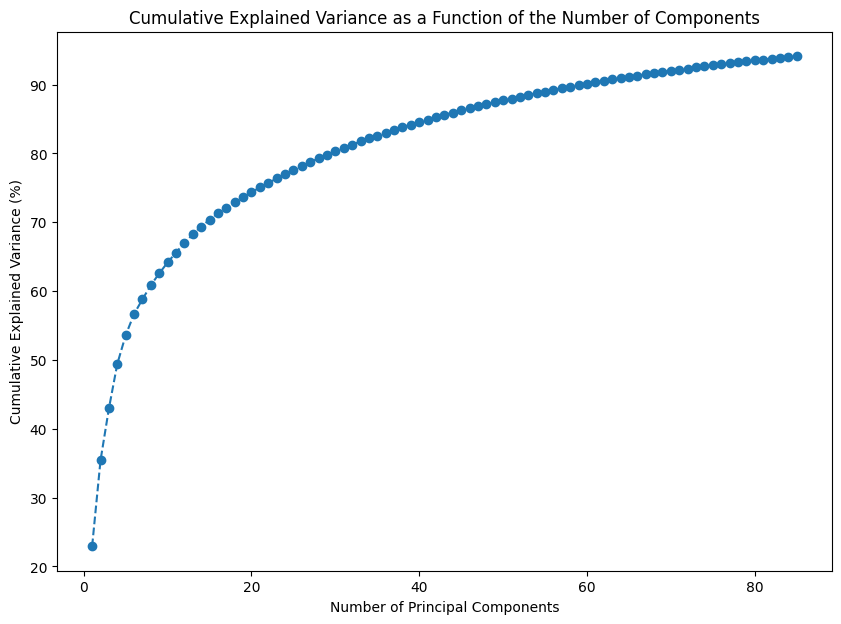

In [15]:
# The explained variance tells you how much information (variance)
# can be attributed to each of the principal components
explained_variance = pca.explained_variance_ratio_

# Calculate cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Convert cumulative explained variance to percentage
cumulative_explained_variance_percentage = cumulative_explained_variance * 100

# Print cumulative explained variance
for i, percentage in enumerate(cumulative_explained_variance_percentage):
    print(f"Principal Component {i+1}: {percentage:.2f}% of the variance is explained")

# Plot cumulative explained variance
plt.figure(figsize=(10, 7))
plt.plot(range(1, len(cumulative_explained_variance_percentage)+1), cumulative_explained_variance_percentage, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance as a Function of the Number of Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.show()

### Each Principal Component row will now correspond to the ticker

In [16]:
stocks_train

['A',
 'AA',
 'AAPL',
 'ABT',
 'ACN',
 'ADBE',
 'ADI',
 'ADM',
 'ADP',
 'ADSK',
 'AEE',
 'AEP',
 'AES',
 'AFL',
 'AIG',
 'AIV',
 'AIZ',
 'AKAM',
 'ALL',
 'ALTR',
 'AMAT',
 'AMD',
 'AMGN',
 'AMP',
 'AMT',
 'AMZN',
 'AN',
 'ANF',
 'AON',
 'APA',
 'APD',
 'APH',
 'ATI',
 'AVB',
 'AVY',
 'AXP',
 'AZO',
 'BA',
 'BAC',
 'BAX',
 'BBY',
 'BDX',
 'BEAM',
 'BEN',
 'BIG',
 'BIIB',
 'BK',
 'BLK',
 'BMY',
 'BSX',
 'BTU',
 'BWA',
 'BXP',
 'C',
 'CAG',
 'CAH',
 'CAT',
 'CB',
 'CCI',
 'CCL',
 'CF',
 'CHRW',
 'CI',
 'CINF',
 'CL',
 'CLF',
 'CLX',
 'CMA',
 'CMCSA',
 'CME',
 'CMG',
 'CMI',
 'CMS',
 'CNP',
 'CNX',
 'COF',
 'COP',
 'COST',
 'CPB',
 'CRM',
 'CSCO',
 'CSX',
 'CTAS',
 'CTSH',
 'CVS',
 'CVX',
 'D',
 'DD',
 'DE',
 'DELL',
 'DFS',
 'DGX',
 'DHI',
 'DHR',
 'DIS',
 'DLTR',
 'DOV',
 'DOW',
 'DRI',
 'DTE',
 'DUK',
 'DVA',
 'DVN',
 'EA',
 'EBAY',
 'ECL',
 'ED',
 'EFX',
 'EIX',
 'EL',
 'EMN',
 'EMR',
 'EOG',
 'EQR',
 'EQT',
 'ETN',
 'ETR',
 'EW',
 'EXC',
 'EXPD',
 'EXPE',
 'F',
 'FAST',
 'FCX',
 'FDX'

In [17]:
principalDf

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10,...,principal component 76,principal component 77,principal component 78,principal component 79,principal component 80,principal component 81,principal component 82,principal component 83,principal component 84,principal component 85
0,1.692049,-2.586806,-0.020036,-4.511346,-0.543968,-2.051308,0.888732,-3.084973,0.624609,-1.080439,...,-0.744707,0.106328,0.852995,0.493233,-0.406655,-0.232852,-0.794404,-0.254650,0.189153,0.667687
1,-4.259906,-1.862524,-0.782223,1.681081,2.091710,1.498877,1.177558,-0.685188,0.612822,-0.557724,...,-0.716768,-0.607530,1.609311,0.574508,0.055331,-0.373376,-0.083935,0.154564,0.634380,1.004294
2,4.295147,-4.225312,-0.046454,-5.660427,0.371119,0.346051,-0.698194,0.048091,-0.391730,1.147882,...,1.190539,0.714894,1.186709,-0.845096,1.683397,-0.408465,-0.096989,0.850971,-0.642172,0.052607
3,-1.020878,-2.604676,-1.904939,-5.380888,-2.834182,-3.254240,1.291221,-1.944141,1.649384,0.297869,...,-0.155851,-0.345921,-0.264278,-1.094989,-0.493931,-0.022084,-1.095282,0.483593,0.543613,-0.810270
4,11.311624,1.788140,3.823823,-3.437834,-7.992266,-0.846150,-3.370594,-2.411126,-1.175143,1.855488,...,-1.170102,1.080488,-0.283168,-1.343382,0.110044,0.013110,-0.442696,-0.567537,-0.852177,0.014624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354,-4.042056,-0.481772,-1.208913,0.418875,0.490181,-0.618252,0.276088,0.148820,0.521698,1.046321,...,-0.514125,0.059242,0.361122,0.034242,0.291789,-0.281212,0.545954,0.196119,-0.362500,0.335871
355,-4.400729,-1.842849,-2.222986,0.131628,1.498866,0.162535,0.025117,-0.281216,-0.070147,0.574492,...,-0.337589,-0.102933,-0.285609,-0.026221,-0.188455,-0.295617,0.025507,0.233138,-0.057852,-0.118081
356,-0.611223,1.038823,0.477480,1.725384,-0.416749,-0.515333,0.716005,-1.623644,-1.672932,-1.432741,...,1.182322,0.220762,0.286227,-0.088125,-0.747514,-0.119324,-0.668792,-0.202904,-0.633243,-0.318366
357,-0.550296,-0.527916,-3.049196,1.081626,0.272270,-0.728589,-1.073969,-0.142443,-1.536255,0.667055,...,0.871365,1.297783,-0.338935,0.842974,0.833363,0.519229,-0.123660,0.225519,-0.487395,0.139525


In [18]:
stocks_train = pd.DataFrame(stocks_train)
finalDf = pd.concat([principalDf, stocks_train], axis = 1)

# Get a list of the column names
cols = list(finalDf.columns)

# Move the last column to the first position
cols = [cols[-1]] + cols[:-1]

# Reindex the DataFrame with the new column order
finalDf = finalDf[cols]

# # Rename the first column
finalDf = finalDf.rename(columns={finalDf.columns[0]: 'Tickers'})
# finalDf['Tickers'] = finalDf['Tickers'].map(labels_dict).fillna(finalDf['Tickers'])
# finalDf.loc[358, 'Tickers'] = 'Unknown'

In [19]:
finalDf.tail()

,Tickers,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,...,principal component 76,principal component 77,principal component 78,principal component 79,principal component 80,principal component 81,principal component 82,principal component 83,principal component 84,principal component 85
354,XRAY,-4.042056,-0.481772,-1.208913,0.418875,0.490181,-0.618252,0.276088,0.148820,0.521698,...,-0.514125,0.059242,0.361122,0.034242,0.291789,-0.281212,0.545954,0.196119,-0.362500,0.335871
355,XRX,-4.400729,-1.842849,-2.222986,0.131628,1.498866,0.162535,0.025117,-0.281216,-0.070147,...,-0.337589,-0.102933,-0.285609,-0.026221,-0.188455,-0.295617,0.025507,0.233138,-0.057852,-0.118081
356,XYL,-0.611223,1.038823,0.477480,1.725384,-0.416749,-0.515333,0.716005,-1.623644,-1.672932,...,1.182322,0.220762,0.286227,-0.088125,-0.747514,-0.119324,-0.668792,-0.202904,-0.633243,-0.318366
357,YUM,-0.550296,-0.527916,-3.049196,1.081626,0.272270,-0.728589,-1.073969,-0.142443,-1.536255,...,0.871365,1.297783,-0.338935,0.842974,0.833363,0.519229,-0.123660,0.225519,-0.487395,0.139525
358,ZION,-3.990143,0.679950,0.312090,2.809235,1.880146,2.002911,0.531537,-0.513825,0.335020,...,-0.301790,-0.432111,0.186610,-0.715872,0.601999,0.050470,-0.018672,-0.118516,0.062628,-0.395602


# PCA Cluster

com 17 dimensões ja obtemos uma dispersao boa para aplicar uma técnica de clustering.

In [20]:
from sklearn.manifold import TSNE

# Apply t-SNE to the data
tsne = TSNE(n_components=3, random_state=0)
tsne_results = tsne.fit_transform(principalDf)

# Create a new DataFrame with the t-SNE results and the ticker
df_tsne = finalDf[['Tickers']].copy()
df_tsne['x-tsne'] = tsne_results[:,0]
df_tsne['y-tsne'] = tsne_results[:,1]
df_tsne['z-tsne'] = tsne_results[:,2]

# Create the 3D scatter plot
fig = px.scatter_3d(df_tsne, x='x-tsne', y='y-tsne', z='z-tsne', color='Tickers')

# Adjust the marker size
fig.update_traces(marker=dict(size=5))

# Set the title
fig.update_layout(title='3D t-SNE projection')

# Show the plot
fig.show()

In [21]:
df_tsne

,Tickers,x-tsne,y-tsne,z-tsne
0,A,-3.231791,-6.540174,-27.894930
1,AA,25.297472,0.091332,-32.128674
2,AAPL,13.579318,-28.986670,-12.081094
3,ABT,-3.551941,1.280809,-29.457836
4,ACN,-12.282198,-21.262056,-17.561172
...,...,...,...,...
354,XRAY,-9.777902,20.273216,1.657230
355,XRX,6.810929,0.236993,4.262866
356,XYL,-26.347586,-1.994281,-2.046491
357,YUM,-12.228281,-9.437028,-3.804139


# DBS Prof Claudia 

In [22]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Select only the principal component columns for clustering
X = df_tsne.iloc[:, 1:] 

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Compute silhouette score for different values of eps
eps_values = range(1, 50) # Adjust the range as needed
silhouette_scores = []
for eps in eps_values:
    dbscan = DBSCAN(eps=eps, min_samples=2)
    clusters = dbscan.fit_predict(X_scaled)
    if len(set(clusters)) > 1:
        silhouette_scores.append(silhouette_score(X_scaled, clusters))
    else:
        silhouette_scores.append(-1)

# QUANTO MAIS PERTO DE 1 melhor 
optimal_eps = eps_values[silhouette_scores.index(max(silhouette_scores))]
print("Optimal eps:", optimal_eps)

Optimal eps: 1


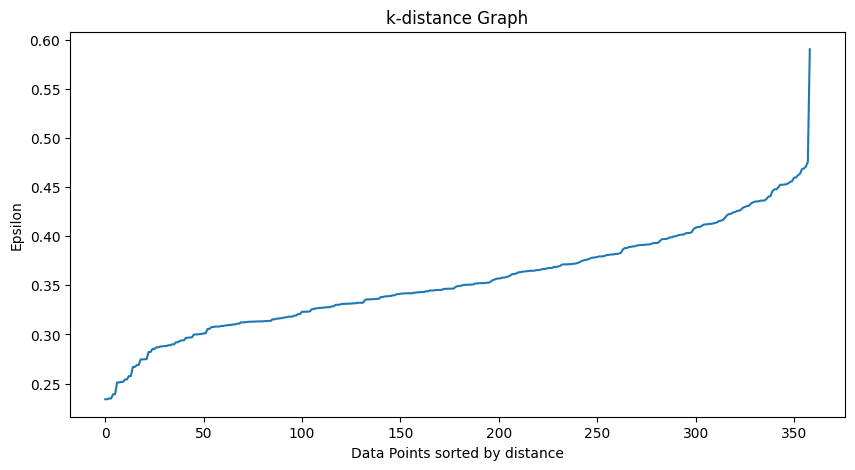

In [23]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Compute the nearest neighbors
nearest_neighbors = NearestNeighbors(n_neighbors=2)
neighbors = nearest_neighbors.fit(X_scaled)
distances, indices = neighbors.kneighbors(X_scaled)

# Sort the distances
distances = np.sort(distances, axis=0)
distances = distances[:,1]

# Plot the k-distance graph
plt.figure(figsize=(10, 5))
plt.plot(distances)
plt.title('k-distance Graph')
plt.xlabel('Data Points sorted by distance')
plt.ylabel('Epsilon')
plt.show()

o ponto de máxima inflexão é entre 0.4 e 0.5

In [24]:
# Apply DBSCAN
# O EPS eu fui experimentando... o min_samples eu assumi um minimo de 2 (2 stocks --> um par)
dbscan = DBSCAN(eps=0.45, min_samples=2)
clusters = dbscan.fit_predict(X_scaled)

# Add the cluster labels to the DataFrame
df_tsne['Cluster'] = clusters

# Check the cluster assignments
print(df_tsne[['Tickers', 'Cluster']])

    Tickers  Cluster
0         A        0
1        AA        1
2      AAPL        2
3       ABT        0
4       ACN        3
..      ...      ...
354    XRAY       16
355     XRX        5
356     XYL        5
357     YUM       31
358    ZION        5

[359 rows x 2 columns]


In [25]:
import plotly.graph_objects as go

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=df_tsne['x-tsne'],
    y=df_tsne['y-tsne'],
    z=df_tsne['z-tsne'],
    mode='markers',
    marker=dict(
        size=6,
        color=df_tsne['Cluster'],  # set color to match cluster labels
        colorscale='Jet',   # change colorscale to 'Jet'
        opacity=0.8
    ),
    text=df_tsne['Tickers'],  # set markers' text to match ticker labels
)])

# Update layout for a better view
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

fig.show()

In [26]:
# Group the DataFrame by the 'Cluster' column
grouped = df_tsne.groupby('Cluster')

# Iterate over the groups
for name, group in grouped:
    print(f"Cluster {name}:")
    print(group['Tickers'].values)

Cluster -1:
['ADSK' 'ALL' 'CTAS' 'EA' 'EBAY' 'ECL' 'KMX' 'NEM' 'NRG' 'NUE' 'PDCO'
 'PGR' 'PRGO' 'ROP' 'SRCL' 'THC']
Cluster 0:
['A' 'ABT' 'AMGN' 'BAX' 'BDX' 'BSX' 'DHR' 'EW' 'ISRG' 'JNJ' 'LLY' 'MDT'
 'SYK' 'TMO' 'WAT']
Cluster 1:
['AA' 'CLF' 'FCX' 'PLL' 'X']
Cluster 2:
['AAPL' 'ADBE' 'AMZN' 'CMG' 'COST' 'CRM' 'GOOG' 'INTU' 'MSFT' 'NFLX'
 'VRSN']
Cluster 3:
['ACN' 'ADP' 'EFX' 'MSI' 'PAYX']
Cluster 4:
['ADI' 'AMAT' 'KLAC' 'LRCX' 'QCOM' 'SE' 'TER' 'TXN']
Cluster 5:
['ADM' 'AES' 'AFL' 'AIG' 'AIV' 'AIZ' 'AKAM' 'AMP' 'AMT' 'APA' 'APD' 'ATI'
 'AVB' 'AVY' 'AXP' 'BA' 'BAC' 'BEN' 'BK' 'BLK' 'BTU' 'BXP' 'C' 'CCI' 'CF'
 'CMA' 'CMCSA' 'CNP' 'CNX' 'COF' 'COP' 'CSCO' 'CSX' 'CVX' 'DELL' 'DFS'
 'DHI' 'DOV' 'DVN' 'EMR' 'EOG' 'EQR' 'EQT' 'ETN' 'EXC' 'EXPE' 'F' 'FAST'
 'FE' 'FHN' 'FITB' 'FLR' 'FLS' 'FTI' 'GCI' 'GD' 'GLW' 'GNW' 'GS' 'GT'
 'GWW' 'HAL' 'HAS' 'HBAN' 'HES' 'HIG' 'HP' 'HPQ' 'HRB' 'HST' 'IFF' 'IGT'
 'INTC' 'IP' 'IPG' 'IR' 'IRM' 'ITW' 'IVZ' 'JCI' 'JNPR' 'JPM' 'KEY' 'KIM'
 'KMI' 'KO' 'L' 'LEG' 'LE

In [27]:
#remove the outliers from cluster -1

df_tsne = df_tsne[df_tsne['Cluster'] != -1]
df_tsne

,Tickers,x-tsne,y-tsne,z-tsne,Cluster
0,A,-3.231791,-6.540174,-27.894930,0
1,AA,25.297472,0.091332,-32.128674,1
2,AAPL,13.579318,-28.986670,-12.081094,2
3,ABT,-3.551941,1.280809,-29.457836,0
4,ACN,-12.282198,-21.262056,-17.561172,3
...,...,...,...,...,...
354,XRAY,-9.777902,20.273216,1.657230,16
355,XRX,6.810929,0.236993,4.262866,5
356,XYL,-26.347586,-1.994281,-2.046491,5
357,YUM,-12.228281,-9.437028,-3.804139,31


# backtesting

In [28]:
pairs_dfs = {}
pair_rets = {}
traded_pairs = {}
results_df = pd.DataFrame(columns=['Total return', 'APR', 'Sharpe', 'MaxDD', 'MaxDDD'])

In [29]:
# transform prices to cumulative returns
cumret = (1 + returns).cumprod()
cumret = cumret / cumret.iloc[0]
cumret_train = cumret.loc[returns_train.index]
cumret_test = cumret.loc[returns_test.index]


# Benchmark
benchmark_cumret = (1 + benchmark_test).cumprod()
benchmark_cumret = benchmark_cumret / benchmark_cumret.iloc[0]
benchmark_cumret_test = benchmark_cumret.loc[benchmark_test.index]

# Strategy 1

In [30]:
def calculate_metrics(cumret):
    '''
    calculate performance metrics from cumulative returns
    '''
    total_return = (cumret.iloc[-1] - cumret.iloc[0]) / cumret.iloc[0]
    apr = (1 + total_return) ** (252 / len(cumret)) - 1
    rets = pd.DataFrame(cumret).pct_change()
    rets.iloc[0] = 0
    sharpe = np.sqrt(252) * np.nanmean(rets) / np.nanstd(rets)
    
    # maxdd and maxddd
    highwatermark = np.zeros(cumret.shape)
    drawdown = np.zeros(cumret.shape)
    drawdownduration = np.zeros(cumret.shape)
    
    for t in np.arange(1, cumret.shape[0]):
        highwatermark[t] = np.maximum(highwatermark[t-1], cumret.iloc[t])
        drawdown[t] = cumret.iloc[t] / highwatermark[t] - 1
        if drawdown[t] == 0:
            drawdownduration[t] = 0
        else:
            drawdownduration[t] = drawdownduration[t-1] + 1
    
    maxDD = np.min(drawdown)
    maxDDD = np.max(drawdownduration)
    
    return total_return, apr, sharpe, maxDD, maxDDD

def parse_pair(pair):
    s1 = pair[:pair.find('-')]
    s2 = pair[pair.find('-')+1:]
    return s1,s2

def calculate_distances(cumret):
    '''
    calculate Euclidean distance for each pair of stocks in the dataframe
    return sorted dictionary (in ascending order)
    '''
    distances = {} # dictionary with distance for each pair
    
    # calculate distances
    for s1 in cumret.columns:
        for s2 in cumret.columns:
            if s1!=s2 and (f'{s1}-{s2}' not in distances.keys()) and (f'{s2}-{s1}' not in distances.keys()):
                dist = np.sqrt(np.sum((cumret[s1] - cumret[s2])**2)) # Euclidean distance
                distances[f'{s1}-{s2}'] = dist
    
    # sort dictionary
    sorted_distances = {k:v for k,v in sorted(distances.items(), key = lambda item: item[1])}
    
    return sorted_distances

def cadf_pvalue(s1, s2, cumret):
    '''
    perform CADF cointegration tests
    since it is sensitive to the order of stocks in the pair, perform both tests (s1-2 and s2-s1)
    return the smallest p-value of two tests
    '''
    from statsmodels.tsa.stattools import coint
    
    p1 = coint(cumret[s1], cumret[s2])[1]
    p2 = coint(cumret[s2], cumret[s1])[1]
    
    return min(p1,p2)

def calculate_halflife(spread):
    '''
    calculate half-life of mean reversion of the spread
    '''
    from statsmodels.regression.linear_model import OLS
    from statsmodels.tools.tools import add_constant
    
    ylag = spread.shift()
    deltay = spread - ylag
    ylag.dropna(inplace=True)
    deltay.dropna(inplace=True)

    res = OLS(deltay, add_constant(ylag)).fit()
    halflife = -np.log(2)/res.params[0]
    
    return halflife

def plot_pairs(sorted_distances, cumret_train, cumret_test, N=5):

    '''
    plot cumulative returns of the spread for each of N pairs with smallest Euclidean distance
    '''
    pairs = [k for k,v in sorted_distances.items()][:N]
    
    for pair in pairs:
        s1,s2 = parse_pair(pair)
        spread_train = cumret_train[s1] - cumret_train[s2]
        spread_test = cumret_test[s1] - cumret_test[s2]
        spread_mean = spread_train.mean() # historical mean
        spread_std = spread_train.std() # historical standard deviation
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,4))
        fig.suptitle(f'Spread of {pair} pair', fontsize=16)
        ax1.plot(spread_train, label='spread')
        ax1.set_title('Formation period')
        ax1.axhline(y=spread_mean, color='g', linestyle='dotted', label='mean')
        ax1.axhline(y=spread_mean+2*spread_std, color='r', linestyle='dotted', label='2-SD band')
        ax1.axhline(y=spread_mean-2*spread_std, color='r', linestyle='dotted')
        ax1.legend()
        ax2.plot(spread_test, label='spread')
        ax2.set_title('Trading period')
        ax2.axhline(y=spread_mean, color='g', linestyle='dotted', label='mean')
        ax2.axhline(y=spread_mean+2*spread_std, color='r', linestyle='dotted', label='2-SD band')
        ax2.axhline(y=spread_mean-2*spread_std, color='r', linestyle='dotted')
        ax2.legend()

def calculate_metrics2(potential_pairs, cumret):
    '''
    calculate metrics for N pairs with the smallest Euclidean distance
    return dataframe of results
    '''
    from hurst import compute_Hc
    from statsmodels.tsa.stattools import adfuller

    cols = ['CADF p-value', 'ADF p-value', 'Spread SD', 
        'Num zero-crossings', 'Hurst Exponent', 'Half-life of mean reversion', '% days within 2-SD band']
    results = pd.DataFrame(index=potential_pairs, columns=cols)
    
    for pair in potential_pairs:
        s1,s2 = parse_pair(pair)
        spread = cumret[s1] - cumret[s2]
        results.at[pair, 'CADF p-value'] = cadf_pvalue(s1, s2, cumret)
        results.at[pair, 'ADF p-value'] = adfuller(spread)[1]
        results.at[pair, 'Spread SD'] = spread.std()
        results.at[pair, 'Num zero-crossings'] = ((spread[1:].values * spread[:-1].values) < 0).sum()
        results.at[pair, 'Hurst Exponent'] = compute_Hc(spread)[0]
        results.at[pair, 'Half-life of mean reversion'] = calculate_halflife(spread)
        results.at[pair, '% days within 2-SD band'] = (abs(spread) < 2*spread.std()).sum() / len(spread) * 100
        
    return results

### Find stocks within the clusters that have a historically close relationship.
#### Spread SSD (Sum of Squared Differences) -> quantify the variability or dispersion of this spread over time.
#### Spread SD (Standard Deviation) -> measuring volatily. how much the spread between the two stocks deviates from its mean value.

In [31]:
import itertools

pairs_df = pd.DataFrame(columns=['Spread SSD', 'Spread SD'])

# Group the DataFrame by the 'Cluster' column
grouped = df_tsne.groupby('Cluster')

for name, group in grouped:
    stocks = group['Tickers']
    
    # Generate unique pairs of stocks
    for s1, s2 in itertools.combinations(stocks, 2):
        # Check if both stocks are in cumret_train.columns
        if s1 in cumret_train.columns and s2 in cumret_train.columns:
            spread = cumret_train[s1] - cumret_train[s2]
            ssd = np.sum(spread**2) / len(spread)
            sd = spread.std()
            pairs_df.at[f'{s1}-{s2}', 'Spread SSD'] = ssd
            pairs_df.at[f'{s1}-{s2}', 'Spread SD'] = sd

In [32]:
pairs_df.sort_values(by='Spread SSD')

,Spread SSD,Spread SD
AEP-CMS,0.000567,0.023597
DUK-SO,0.001125,0.029938
D-WEC,0.001497,0.036967
CMS-XEL,0.00155,0.02971
MMC-RSG,0.001912,0.042712
...,...,...
GME-RL,462.204222,14.085154
DLTR-GME,466.357955,14.236442
GME-TJX,468.672603,14.217143
GME-VFC,471.700989,14.266733


$$
Sharpe\ Ratio = \frac{{R_p - R_f}}{{\sigma_p}} = \sqrt{252} \times \frac{\text{Mean}(r)}{\text{Std}(r)}
$$

Where:
- $R_p$ is the expected return of the investment or strategy.
- $R_f$ is the risk-free rate of return (typically the return on government bonds).
- $\sigma_p$ is the standard deviation of the excess return.

The Sharpe ratio compares the return of an investment with its risk. We want to gain insight of our strategy that excess returns over a period of time may signify more volatility and risk, rather than investing skill. The Sharpe ratio can help explain whether a portfolio's excess returns are attributable to smart investment decisions or simply luck and risk.

The greater a portfolio's Sharpe ratio, the better its risk-adjusted performance. A negative Sharpe ratio means the risk-free or benchmark rate is greater than the portfolio’s historical or projected return, or else the portfolio's return is expected to be negative.

In [33]:
len(pairs_df)

14505

In [34]:
# calculate in-sample Sharpe ratios for top N pairs
N = 539
insample_sharpe = pd.DataFrame(index=pairs_df.sort_values(by='Spread SSD').index[:N], columns=['Sharpe'])


for pair in tqdm(insample_sharpe.index):
    s1,s2 = parse_pair(pair)
    
    # construct spread
    spread = cumret_train[s1] - cumret_train[s2]
    sd = pairs_df.loc[pair]['Spread SD'] # historical SD
    
    positions = pd.DataFrame(index=spread.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    # Convert the data types to float before using ffill, bfill and infer_objects
    positions = positions.astype(float).ffill().bfill().infer_objects()
    
    ret = (positions.shift() * returns_train[[s1,s2]]).sum(axis=1)
    std_dev = np.nanstd(ret)
    #evitar erro de multiplicação
    if std_dev != 0 and not np.isnan(std_dev):
        insample_sharpe.loc[pair] = np.sqrt(252) * np.nanmean(ret) / std_dev
    else:
        insample_sharpe.loc[pair] = np.nan 

  1%|▏         | 8/539 [00:00<00:07, 70.34it/s]

100%|██████████| 539/539 [00:06<00:00, 80.91it/s]


In [35]:
cond1 = insample_sharpe['Sharpe'] > 1
insample_sharpe.loc[cond1].sort_values(by='Sharpe', ascending=False)

,Sharpe
AKAM-PPL,1.882764
CCI-IFF,1.869427
AES-NWL,1.830618
JNPR-TSN,1.813618
CMCSA-MNST,1.787257
...,...
ADI-TXN,1.029335
BA-IP,1.025016
AEP-CMS,1.017463
FAST-VMC,1.016614


In [36]:
potential_pairs = insample_sharpe.loc[cond1].sort_values(by='Sharpe', ascending=False).index
potential_pairs

Index(['AKAM-PPL', 'CCI-IFF', 'AES-NWL', 'JNPR-TSN', 'CMCSA-MNST', 'MMC-WM',
       'CCI-KMI', 'SEE-SUN', 'HST-MTB', 'KIM-ZION', 'BEN-ETN', 'PFG-SUN',
       'AFL-HST', 'NOV-PSX', 'HIG-HRB', 'KMI-MO', 'CNP-WMB', 'AIV-EQR',
       'MMC-RSG', 'FTI-XRX', 'DHI-LEN', 'ITW-MNST', 'INTC-T', 'CAG-CL',
       'AIG-KIM', 'PSX-TSN', 'MAR-MET', 'NKE-SHW', 'ICE-MCO', 'HES-SLB',
       'FLS-MNST', 'HRB-VMC', 'BSX-JNJ', 'HRB-NDAQ', 'A-ISRG', 'AMP-DELL',
       'DHR-ISRG', 'EXC-JNPR', 'AEE-ETR', 'HST-L', 'KEY-KIM', 'CMS-EIX',
       'AFL-L', 'AKAM-WMT', 'PSA-WMB', 'HIG-IRM', 'DD-EMN', 'MMM-XRX',
       'BXP-CCI', 'JCI-MS', 'KEY-LNC', 'PLD-PSA', 'CSX-VTR', 'C-CMCSA',
       'ABT-SYK', 'CL-GIS', 'LNC-PNC', 'BIIB-GILD', 'A-DHR', 'IFF-PPL',
       'ADI-TXN', 'BA-IP', 'AEP-CMS', 'FAST-VMC', 'CNX-XOM'],
      dtype='object')

In [37]:
# Calculate metrics
results = calculate_metrics2(potential_pairs, cumret_train)

# Apply filters and select first 10 rows
filtered_results = results[(results['CADF p-value'] < 0.05) & (results['ADF p-value'] < 0.05)].head(10)
# Make a copy of the original DataFrame
filtered_results_copy = filtered_results.copy()

# Apply the dictionary to the index of the copy
filtered_results_copy.index = filtered_results_copy.index.map(lambda x: '-'.join(labels_dict.get(i, i) for i in x.split('-')))

filtered_results_copy

,CADF p-value,ADF p-value,Spread SD,Num zero-crossings,Hurst Exponent,Half-life of mean reversion,% days within 2-SD band
Akamai Technologies Inc-PPL Corp.,0.008718,0.00245,0.067708,48,0.393567,11.924286,93.478261
AES Corp-Newell Rubbermaid Co.,0.026509,0.005402,0.133918,47,0.401981,17.395883,94.664032
Juniper Networks-Tyson Foods,0.013724,0.003195,0.077767,33,0.383083,12.580459,95.652174
Comcast Corp.-Monster Beverage,0.010709,0.008494,0.072282,34,0.347741,14.743933,92.094862
Marsh & McLennan-Waste Management Inc.,0.028786,0.028407,0.050138,45,0.38598,17.424264,95.256917
Sealed Air Corp.(New)-Sunoco Inc.,0.008549,0.009488,0.126458,53,0.355067,17.008115,93.478261
Host Hotels & Resorts-M&T Bank Corp.,0.009665,0.00183,0.077222,50,0.306084,10.630076,85.968379
Kimco Realty-Zions Bancorp,0.007778,0.001867,0.105175,43,0.378567,11.20435,95.652174
Principal Financial Group-Sunoco Inc.,0.002875,0.001975,0.113666,41,0.355935,11.820345,92.490119
AFLAC Inc-Host Hotels & Resorts,0.006779,0.003696,0.081951,66,0.342014,12.871125,94.466403


In [38]:
final_pairs = set()
for pair in filtered_results.index:
    final_pairs.add(pair)

final_pairs

{'AES-NWL',
 'AFL-HST',
 'AKAM-PPL',
 'CMCSA-MNST',
 'HST-MTB',
 'JNPR-TSN',
 'KIM-ZION',
 'MMC-WM',
 'PFG-SUN',
 'SEE-SUN'}

In [39]:
# Set option to opt-in to future behavior
pd.set_option('future.no_silent_downcasting', True)

# Convert the set to a list
final_pairs_list = list(final_pairs)

pair_ret = pd.DataFrame(index=returns_test.index, columns=final_pairs_list)

for pair in final_pairs_list:
    s1,s2 = parse_pair(pair)
    
    # construct spread
    spread = cumret_test[s1] - cumret_test[s2]
    sd = pairs_df.loc[pair]['Spread SD'] # historical SD
    
    positions = pd.DataFrame(index=returns_test.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position

    # Address FutureWarnings
    positions = positions.ffill().infer_objects(copy=False)
    positions = positions.fillna(0).infer_objects(copy=False)
    
    ret = (positions.shift() * returns_test[[s1,s2]]).sum(axis=1)
    
    pair_ret[pair] = ret


In [40]:
# cumulative returns of individual pairs
pair_cumret = (1 + pair_ret).cumprod()
pair_cumret

,SEE-SUN,CMCSA-MNST,AKAM-PPL,KIM-ZION,AFL-HST,HST-MTB,AES-NWL,JNPR-TSN,PFG-SUN,MMC-WM
2022-04-14,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2022-04-18,1.000000,1.000000,1.000000,1.012875,1.000000,1.004643,1.000000,1.000000,1.000000,0.988710
2022-04-19,1.000000,1.000000,1.000000,1.014467,1.000000,0.971660,1.000000,1.000000,1.000000,0.986066
2022-04-20,1.000000,1.000000,1.000000,0.993154,1.000000,1.057409,1.000000,1.000000,1.000000,0.981958
2022-04-21,1.000000,1.000000,1.000000,0.957471,1.000000,1.055174,1.000000,1.000000,1.000000,0.961290
...,...,...,...,...,...,...,...,...,...,...
2024-04-08,0.412522,0.633219,1.192432,1.147442,1.060081,1.078726,0.507227,0.648701,1.340074,1.428186
2024-04-09,0.428914,0.623371,1.179245,1.143488,1.093379,1.071260,0.518398,0.651341,1.333737,1.430056
2024-04-10,0.434108,0.627206,1.188087,1.139024,1.066059,1.056345,0.516613,0.641425,1.359073,1.396097
2024-04-11,0.440713,0.634753,1.172061,1.145637,1.119344,1.047837,0.516751,0.655020,1.352483,1.397442


In [41]:
# fraction of pairs with positive returns
(pair_cumret.iloc[-1] > 1).sum() / pair_cumret.shape[1]

0.6

In [42]:
# fraction of pairs with no positions
(pair_cumret.iloc[-1] == 1).sum() / pair_cumret.shape[1]

0.0

In [43]:
total_ret = pair_ret.sum(axis=1) / len(pair_ret.columns)

In [44]:
total_cumret = (1 + total_ret).cumprod()
total_cumret

2022-04-14    1.000000
2022-04-18    1.000623
2022-04-19    0.997227
2022-04-20    1.003517
2022-04-21    0.997588
                ...   
2024-04-08    0.954689
2024-04-09    0.960115
2024-04-10    0.956229
2024-04-11    0.963791
2024-04-12    0.955113
Length: 501, dtype: float64

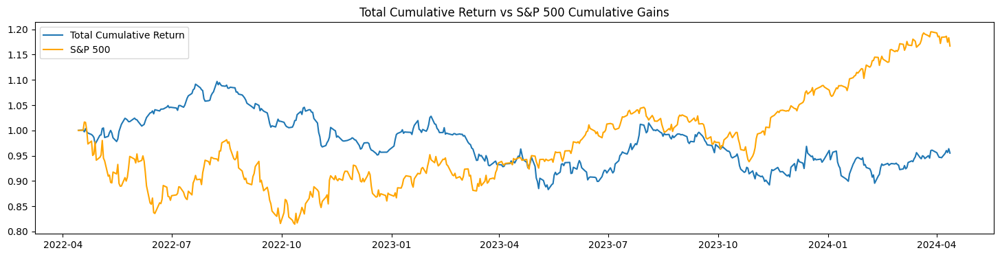

In [45]:
plt.figure(figsize=(18,4))
plt.plot(total_cumret, label='Total Cumulative Return')
plt.plot(benchmark_cumret_test, color='orange', label='S&P 500')
plt.title('Total Cumulative Return vs S&P 500 Cumulative Gains')
plt.legend()
plt.show()

In [46]:
results_df.loc['PCA-DBSCAN Srategy'] = calculate_metrics(total_cumret)
results_df

,Total return,APR,Sharpe,MaxDD,MaxDDD
PCA-DBSCAN Srategy,-0.044887,-0.022835,-0.125597,-0.195035,422.0


# Strategy 2 - Euclidean distance

In [47]:
pairs_df = pd.DataFrame(columns=['Spread SSD', 'Spread SD'])
stocks = cumret.columns

for s1 in tqdm(stocks):
    for s2 in stocks:
        if (s1!=s2) and (f'{s2}-{s1}' not in pairs_df.index):
            spread = cumret_train[s1] - cumret_train[s2]
            ssd = np.sum(spread**2) / len(spread)
            sd = spread.std()
            pairs_df.loc[f'{s1}-{s2}', ['Spread SSD', 'Spread SD']] = ssd, sd

100%|██████████| 359/359 [03:37<00:00,  1.65it/s]


In [48]:
pairs_df.sort_values(by='Spread SSD')

,Spread SSD,Spread SD
AEP-CMS,0.000567,0.023597
DUK-SO,0.001125,0.029938
D-WEC,0.001497,0.036967
CMS-XEL,0.00155,0.02971
MMC-RSG,0.001912,0.042712
...,...,...
ED-GME,484.701781,14.315017
GILD-GME,484.949543,14.32626
BIIB-GME,485.69292,14.303269
FE-GME,485.830413,14.282823


In [49]:
# calculate in-sample Sharpe ratios for top N pairs
N = 20000
insample_sharpe = pd.DataFrame(index=pairs_df.sort_values(by='Spread SSD').index[:N], columns=['Sharpe'])


for pair in tqdm(insample_sharpe.index):
    s1,s2 = parse_pair(pair)
    
    # construct spread
    spread = cumret_train[s1] - cumret_train[s2]
    sd = pairs_df.loc[pair]['Spread SD'] # historical SD
    
    positions = pd.DataFrame(index=spread.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    # Convert the data types to float before using ffill, bfill and infer_objects
    positions = positions.astype(float).ffill().bfill().infer_objects()
    
    ret = (positions.shift() * returns_train[[s1,s2]]).sum(axis=1)
    std_dev = np.nanstd(ret)
    #evitar erro de multiplicação
    if std_dev != 0 and not np.isnan(std_dev):
        insample_sharpe.loc[pair] = np.sqrt(252) * np.nanmean(ret) / std_dev
    else:
        insample_sharpe.loc[pair] = np.nan 

  0%|          | 11/20000 [00:00<06:31, 51.08it/s]

100%|██████████| 20000/20000 [04:28<00:00, 74.48it/s]


In [50]:
cond1 = insample_sharpe['Sharpe'] > 1
insample_sharpe.loc[cond1].sort_values(by='Sharpe', ascending=False)

,Sharpe
UNH-WMB,2.25738
CCI-IBM,2.179875
EA-V,2.134863
EW-RSG,2.123259
HST-TRV,2.100267
...,...
SYK-VMC,1.000977
CPB-WEC,1.000881
CCL-IP,1.000741
ECL-TAP,1.000302


In [51]:
potential_pairs = insample_sharpe.loc[cond1].sort_values(by='Sharpe', ascending=False).index
insample_sharpe

,Sharpe
AEP-CMS,1.017463
DUK-SO,0.623022
D-WEC,0.560273
CMS-XEL,0.631686
MMC-RSG,1.372691
...,...
JCI-SLB,0.083419
BXP-MSI,-0.286953
HRL-TJX,-0.262795
BDX-WDC,-0.114923


In [52]:
pair_ret = pd.DataFrame(index=returns_test.index, columns=potential_pairs)

for pair in tqdm(potential_pairs):
    s1,s2 = parse_pair(pair)
    
    # construct spread
    spread = cumret_test[s1] - cumret_test[s2]
    sd = pairs_df.loc[pair]['Spread SD'] # historical SD
    
    positions = pd.DataFrame(index=returns_test.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    positions.ffill(inplace=True)
    positions.fillna(0, inplace=True)
    
    ret = (positions.shift() * returns_test[[s1,s2]]).sum(axis=1)
    
    pair_ret[pair] = ret

  1%|          | 10/872 [00:00<00:17, 48.64it/s]

100%|██████████| 872/872 [00:16<00:00, 54.14it/s]


In [53]:
# cumulative returns of individual pairs
pair_cumret = (1 + pair_ret).cumprod()
pair_cumret

,UNH-WMB,CCI-IBM,EA-V,EW-RSG,HST-TRV,JNJ-KMI,EA-HUM,IBM-JNJ,CMS-MRK,NTAP-PNC,...,SYK-USB,ALL-V,MCHP-URBN,CMG-EMN,JWN-UNM,SYK-VMC,CPB-WEC,CCL-IP,ECL-TAP,DVA-TXN
2022-04-14,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2022-04-18,1.0,1.005897,0.994625,1.0,1.0,1.0,1.01072,1.00937,1.0,1.0,...,1.0,1.011916,1.0,1.0,0.982663,1.0,1.0,1.0,1.0,1.0
2022-04-19,1.0,1.014273,0.998128,1.0,1.0,1.0,1.015766,1.002416,1.0,1.0,...,1.0,1.00937,1.0,1.0,0.978118,1.0,0.999718,1.0,1.0,1.0
2022-04-20,1.0,1.065049,0.982582,1.0,1.008799,1.0,0.994729,1.069156,1.0,1.0,...,1.0,1.004053,1.0,1.0,0.966136,1.0,1.011642,1.0,1.0,1.0
2022-04-21,1.0,1.085062,0.992054,1.0,0.990198,1.0,1.018649,1.084064,1.0,1.0,...,1.0,1.016929,1.0,1.0,0.927969,1.0,1.015483,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-08,1.565193,0.523815,0.893894,0.596355,1.413449,1.243411,1.539381,0.971042,0.678702,0.846708,...,0.804326,1.485562,1.423575,0.547597,0.367392,1.188932,1.506867,2.307577,1.023869,1.054906
2024-04-09,1.566308,0.534686,0.901985,0.600055,1.466517,1.241026,1.543933,0.978135,0.67962,0.862385,...,0.805706,1.485562,1.423575,0.556186,0.377569,1.210948,1.506867,2.307577,1.008598,1.077045
2024-04-10,1.547731,0.521381,0.899693,0.587295,1.421928,1.238097,1.55818,0.981606,0.666786,0.841183,...,0.778903,1.485562,1.423575,0.541734,0.381713,1.203427,1.506867,2.307577,0.990391,1.065082
2024-04-11,1.530231,0.518465,0.894925,0.588232,1.461977,1.221053,1.545567,0.97313,0.666961,0.817499,...,0.779197,1.485562,1.423575,0.533777,0.39606,1.195548,1.506867,2.307577,0.979011,1.084781


In [54]:
# fraction of pairs with positive returns
(pair_cumret.iloc[-1] > 1).sum() / pair_cumret.shape[1]

0.463302752293578

In [55]:
# fraction of pairs with no positions
(pair_cumret.iloc[-1] == 1).sum() / pair_cumret.shape[1]

0.0022935779816513763

In [56]:
total_ret = pair_ret.sum(axis=1) / len(pair_ret.columns)

In [57]:
total_cumret = (1 + total_ret).cumprod()
total_cumret

2022-04-14         1.0
2022-04-18    0.997688
2022-04-19    1.002504
2022-04-20    1.003693
2022-04-21    1.005173
                ...   
2024-04-08      1.0034
2024-04-09    1.011758
2024-04-10    1.003265
2024-04-11    1.002831
2024-04-12    1.000471
Length: 501, dtype: object

In [58]:
selected_pairs = []
selected_stocks = []

# process opening signals day by day
for i in range(len(pair_cumret.index)):
    idx = pair_cumret.iloc[i][pair_cumret.iloc[i]!=1].index # pairs opened on day i
    # sort by Sharpe ratio and start selecting
    for pair in insample_sharpe.loc[idx].sort_values(by='Sharpe', ascending=False).index:
        s1,s2 = parse_pair(pair)
        if (s1 not in selected_stocks) and (s2 not in selected_stocks):
            selected_pairs.append(pair)
            selected_stocks.extend([s1,s2])
        if len(selected_pairs)==10:
            break
    if len(selected_pairs)==10:
            break

In [59]:
insample_sharpe.loc[selected_pairs]

,Sharpe
CCI-IBM,2.179875
EA-V,2.134863
BEN-LH,1.8936
FLS-XRAY,1.780908
L-LLY,1.765512
MMC-WM,1.760711
BDX-ETR,1.72863
ICE-STT,1.632545
AMZN-DVA,1.62622
EL-ETN,1.617564


In [60]:
results2 = calculate_metrics2(selected_pairs, cumret_train)
results2

,CADF p-value,ADF p-value,Spread SD,Num zero-crossings,Hurst Exponent,Half-life of mean reversion,% days within 2-SD band
CCI-IBM,0.010695,0.003482,0.060488,52,0.324788,12.161871,94.664032
EA-V,0.019785,0.008267,0.080053,41,0.371303,14.256086,96.245059
BEN-LH,0.031436,0.007995,0.129164,44,0.35974,13.476497,95.256917
FLS-XRAY,0.039078,0.011161,0.086698,59,0.346679,11.987538,94.268775
L-LLY,0.286298,0.177542,0.148654,26,0.403677,30.788206,97.035573
MMC-WM,0.028786,0.028407,0.050138,45,0.38598,17.424264,95.256917
BDX-ETR,0.057854,0.044503,0.069436,21,0.417975,20.130362,97.628458
ICE-STT,0.016721,0.0057,0.092166,44,0.356742,13.58415,96.640316
AMZN-DVA,0.037075,0.185756,0.162328,29,0.39733,31.812523,97.233202
EL-ETN,0.014156,0.026404,0.090354,43,0.350855,13.979673,91.897233


In [61]:
top_ret = pair_ret[selected_pairs].sum(axis=1) / len(selected_pairs)
top_cumret2 = (1 + top_ret).cumprod()

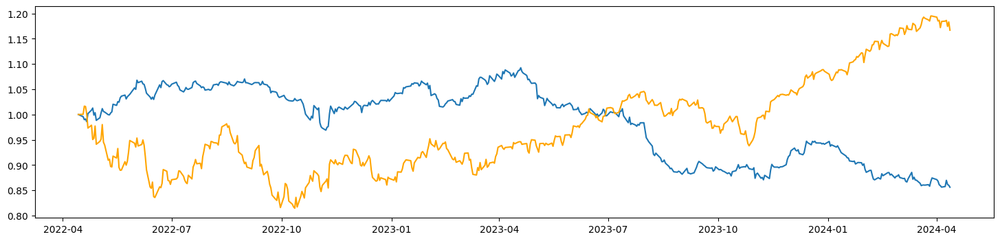

In [62]:
plt.figure(figsize=(18,4))
plt.plot(top_cumret2)
plt.plot(benchmark_cumret_test, color='orange', label='S&P 500')

In [63]:
results_df.loc['Simple Distance (top10 pairs)'] = calculate_metrics(top_cumret2)
results_df

,Total return,APR,Sharpe,MaxDD,MaxDDD
PCA-DBSCAN Srategy,-0.044887,-0.022835,-0.125597,-0.195035,422.0
Simple Distance (top10 pairs),-0.143987,-0.075221,-0.707792,-0.216489,247.0


# Cointegration Example

Assume we have two stocks: stock A and stock B. Their are subject to the same risk factor F, which follows a random walk process, but their coefficient of dependence on F (betas) are different. More formally we have the following:
$$
\begin{array}{ll}
P_{a, t}=1.5 * F_t+w_{a, t}, & w_a \sim \mathcal{N}(0,1) \\
P_{b, t}=0.5 * F_t+w_{b, t}, & w_b \sim \mathcal{N}(0,1)
\end{array}
$$

In [64]:
# generate random walk process
np.random.seed(112)
F = [15]
for i in range(252):
    F.append(F[i] + np.random.randn())
F = np.array(F)

# generate price series
P_a = 1.5*F + np.random.randn(len(F))
P_b = 0.5*F + np.random.randn(len(F))

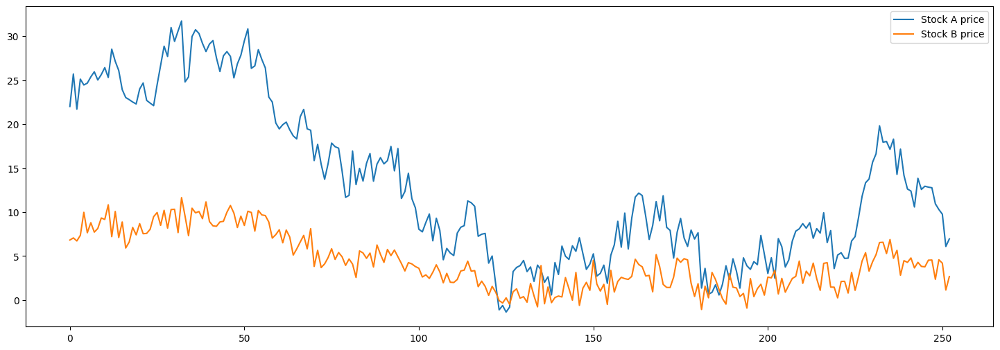

In [65]:
# plot prices
plt.figure(figsize=(18,6))
plt.plot(P_a, label='Stock A price')
plt.plot(P_b, label='Stock B price')
plt.legend()

 if we construct a pair portfolio by allocating the same amount of capital to each stock (long stock A and short stock B), we won’t be able to cancel the random walk component and therefore our portfolio won’t be stationary.You can see below that the mean of the portfolio is not stable. This is because we still have a random walk component in the portfolio price series.
 
$$
P_{p f, t}=P_a-P_b=1.5 * F_t+w_{a, t}-0.5 * F_t-w_{b, t}=1.0 * F_t+w_{a, t}-w_{b, t}
$$

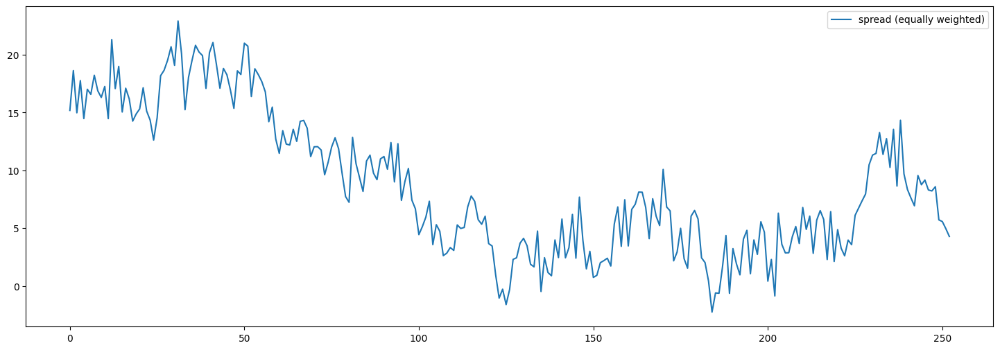

In [66]:
# plot spread (equally weighted positions)
spread_ew = P_a - P_b
plt.figure(figsize=(18,6))
plt.plot(spread_ew, label='spread (equally weighted)')
plt.legend()

it is still possible to create a stationary pair, we just need to change the weights of stocks in the portfolio so that the random walk component is canceled. Formula for our new portfolio will look like this:

$$
P_{pf} = P_a - \text{{hedge ratio}} * P_b
$$

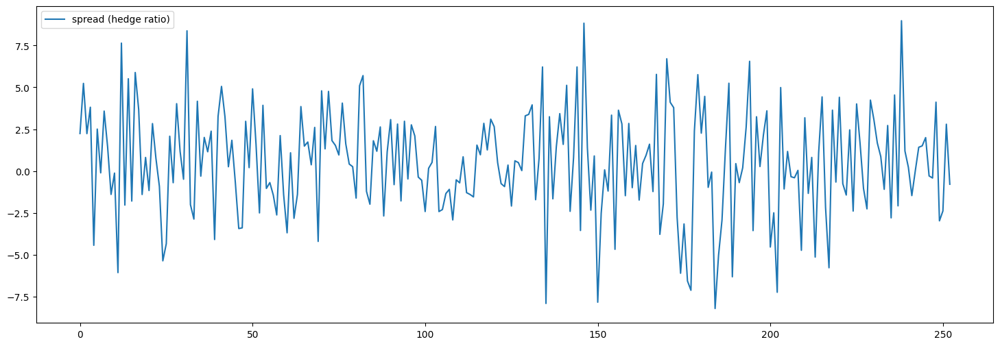

In [67]:
from statsmodels.regression.linear_model import OLS

# calculate hedge ratio
res = OLS(P_a, P_b).fit()
hedge_ratio = res.params[0]

# create portfolio using calculated ratio
spread_hr = P_a - hedge_ratio*P_b

plt.figure(figsize=(18,6))
plt.plot(spread_hr, label='spread (hedge ratio)')
plt.legend()

This portfolio looks a lot more stationary than the one we got using equal weights.
Basically, if we have two time series and it is possible to construct a linear combination of them that is stationary (has constant mean and variance), those time series are said to be cointegrated. (This is not a rigorous mathematical definition, but it explains the basic principles). Let’s try to apply cointegration test (Cointegrated Augmented Dicker-Fuller test) to our price series to confirm that they are cointegrated.

In [68]:
from statsmodels.tsa.stattools import coint

coint(P_a, P_b)

(-5.995727015051183,
 1.6583137677940721e-06,
 array([-3.94042787, -3.36048387, -3.06132299]))

# Strategy 3 - Cointegration

In [69]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen

In [70]:
pairs_df = pd.DataFrame(columns=['alpha', 'beta', 'Spread SD', 'ADF', 'Johansen'])

for s1 in tqdm(stocks):
    for s2 in stocks:
        if (s1!=s2) and (f'{s2}-{s1}' not in pairs_df.index):
            adf = 0
            johansen = 0
            
            # construct spread
            res = sm.OLS(prices_train[s1], sm.add_constant(prices_train[s2])).fit()
            alpha,beta = res.params
            spread = res.resid
            sd = spread.std()
            
            adf_pval = adfuller(res.resid)[1]
            if adf_pval < 0.05:
                adf = 1 # null is rejected at 95% level
            
            # Johansen test
            res = coint_johansen(prices_train[[s1,s2]], det_order=0, k_ar_diff=1)
            if (res.lr2 > res.cvm[:,1]).sum() == 2:
                johansen = 1 # null is rejected at 95% level
                
            pairs_df.loc[f'{s1}-{s2}'] = alpha,beta,sd,adf,johansen

100%|██████████| 359/359 [21:31<00:00,  3.60s/it]


In [71]:
pairs_df[(pairs_df['ADF']==1) & (pairs_df['Johansen']==1)]

,alpha,beta,Spread SD,ADF,Johansen
AAPL-FAST,-69.487663,3.981443,10.649163,1.0,1.0
ABT-DRI,66.371607,0.393852,5.611908,1.0,1.0
ABT-EMN,61.267869,0.527794,6.789927,1.0,1.0
ABT-HAS,13.837424,1.120571,6.426055,1.0,1.0
ABT-HBAN,64.192188,3.766783,6.393628,1.0,1.0
...,...,...,...,...,...
V-XRAY,119.065354,1.734522,9.578454,1.0,1.0
VNO-XRAY,19.734580,0.399756,3.028523,1.0,1.0
VNO-YUM,21.465282,0.178139,3.446973,1.0,1.0
WEC-XEL,14.477855,1.169007,2.090573,1.0,1.0


In [72]:
# remove pairs with negative beta
cond1 = (pairs_df['beta'] > 0)
cond2 = (pairs_df['ADF'] == 1)
cond3 = (pairs_df['Johansen'] == 1)
pairs_df.loc[cond1 & cond2 & cond3]

,alpha,beta,Spread SD,ADF,Johansen
AAPL-FAST,-69.487663,3.981443,10.649163,1.0,1.0
ABT-DRI,66.371607,0.393852,5.611908,1.0,1.0
ABT-EMN,61.267869,0.527794,6.789927,1.0,1.0
ABT-HAS,13.837424,1.120571,6.426055,1.0,1.0
ABT-HBAN,64.192188,3.766783,6.393628,1.0,1.0
...,...,...,...,...,...
V-XRAY,119.065354,1.734522,9.578454,1.0,1.0
VNO-XRAY,19.734580,0.399756,3.028523,1.0,1.0
VNO-YUM,21.465282,0.178139,3.446973,1.0,1.0
WEC-XEL,14.477855,1.169007,2.090573,1.0,1.0


In [73]:
potential_pairs = pairs_df.loc[cond1 & cond2 & cond3].index

In [74]:
results3 = calculate_metrics2(potential_pairs, cumret_train)
results3

,CADF p-value,ADF p-value,Spread SD,Num zero-crossings,Hurst Exponent,Half-life of mean reversion,% days within 2-SD band
AAPL-FAST,0.051459,0.395266,0.224565,5,0.504944,61.341035,63.833992
ABT-DRI,0.005944,0.182081,0.338103,1,0.535096,46.406731,35.573123
ABT-EMN,0.058419,0.144858,0.242298,1,0.565453,40.901163,36.561265
ABT-HAS,0.005246,0.014387,0.072501,26,0.32823,10.427581,81.818182
ABT-HBAN,0.015594,0.154556,0.226247,21,0.44411,34.80206,67.588933
...,...,...,...,...,...,...,...
V-XRAY,0.00581,0.155599,0.128171,17,0.422399,31.343179,84.980237
VNO-XRAY,0.062939,0.072072,0.14071,0,0.460466,29.647422,24.901186
VNO-YUM,0.120663,0.031168,0.150878,0,0.515896,30.816233,16.007905
WEC-XEL,0.000262,0.000111,0.023959,3,0.448036,11.87734,7.509881


In [75]:
# calculate in-sample Sharpe ratios for all cointegrated pairs
insample_sharpe = pd.DataFrame(index=potential_pairs, columns=['Sharpe'])

for pair in tqdm(insample_sharpe.index):
    s1,s2 = parse_pair(pair)
    
    # construct spread
    alpha, beta, sd = pairs_df.loc[pair, ['alpha', 'beta', 'Spread SD']]
    spread = prices_train[s1] - alpha - beta * prices_train[s2]
    
    positions = pd.DataFrame(index=spread.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    positions = positions.astype(float).ffill().bfill().infer_objects()
    
    ret = (positions.shift() * returns_train[[s1,s2]]).sum(axis=1)
    std_dev = np.nanstd(ret)
    #evitar erro de multiplicação
    if std_dev != 0 and not np.isnan(std_dev):
        insample_sharpe.loc[pair] = np.sqrt(252) * np.nanmean(ret) / std_dev
    else:
        insample_sharpe.loc[pair] = np.nan 

100%|██████████| 772/772 [00:07<00:00, 97.98it/s] 


In [76]:
insample_sharpe.sort_values(by=['Sharpe'], ascending=False)

,Sharpe
LH-TXT,3.584174
ACN-DGX,3.139169
LRCX-MCHP,3.100285
BBY-FDX,3.084364
HUM-YUM,3.053168
...,...
MA-PBI,0.005865
BDX-BLK,-0.02354
AMZN-BIG,-0.198057
FOSL-MCHP,-0.289306


In [77]:
potential_pairs = insample_sharpe[insample_sharpe['Sharpe']>1].sort_values(by=['Sharpe'], ascending=False).index
len(potential_pairs)

682

In [78]:
pair_ret = pd.DataFrame(index=returns_test.index, columns=potential_pairs)

for pair in potential_pairs:
    s1,s2 = parse_pair(pair)
    
    # construct spread
    alpha,beta,sd = pairs_df.loc[pair, ['alpha', 'beta', 'Spread SD']]
    spread = prices_test[s1] - alpha - beta * prices_test[s2]
    
    positions = pd.DataFrame(index=returns_test.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    positions.fillna(method='ffill', inplace=True)
    positions.fillna(0, inplace=True)
    
    ret = (positions.shift() * returns_test[[s1,s2]]).sum(axis=1)
    
    pair_ret[pair] = ret

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise 

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/tmp/ipykernel_150176/727511317.py:29: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise 

In [79]:
pair_cumret = (1 + pair_ret).cumprod()
pair_cumret

,LH-TXT,ACN-DGX,LRCX-MCHP,BBY-FDX,HUM-YUM,NSC-STX,DGX-SHW,EMN-TAP,CAG-PNW,MA-MNST,...,ABT-DRI,ABT-NEE,LH-SYK,AKAM-WHR,PBI-URBN,HAS-PBI,EA-FTI,EA-FOSL,BEN-TJX,AMZN-EBAY
2022-04-14,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2022-04-18,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.997567,1.0,1.0,0.905161,1.020485,1.0,1.0
2022-04-19,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.015402,1.0,1.0,0.917018,0.984875,1.0,1.0
2022-04-20,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.014594,...,1.0,1.0,1.0,1.019405,1.0,1.0,0.897996,0.995983,1.0,1.0
2022-04-21,1.0,1.0,1.0,1.0,1.010535,1.0,1.0,1.0,1.0,1.035143,...,1.0,1.0,1.0,1.035851,1.0,1.0,0.957758,1.019596,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-08,0.606588,1.156065,1.054568,0.629804,0.906058,1.494964,1.504603,0.749885,1.399702,1.325778,...,0.836584,1.134052,0.841071,1.861441,0.586967,0.391864,0.215058,3.08603,0.805148,1.281484
2024-04-09,0.610576,1.170924,1.077749,0.646915,0.901486,1.50729,1.525771,0.752599,1.389499,1.346683,...,0.849157,1.123443,0.838001,1.843819,0.655879,0.350109,0.219673,3.131994,0.806139,1.287604
2024-04-10,0.606452,1.196142,1.048614,0.640278,0.894098,1.510969,1.573851,0.74155,1.404355,1.332504,...,0.852493,1.112591,0.83506,1.806141,0.637256,0.362959,0.210962,3.010256,0.77665,1.298052
2024-04-11,0.610959,1.178689,1.038965,0.636787,0.883567,1.497887,1.560796,0.733061,1.376624,1.333002,...,0.859507,1.108572,0.83486,1.801182,0.619944,0.360324,0.215385,2.981693,0.779447,1.262308


In [80]:
# fraction of pairs with positive returns
(pair_cumret.iloc[-1] > 1).sum() / pair_cumret.shape[1]

0.43548387096774194

In [81]:
# fraction of pairs with no positions
(pair_cumret.iloc[-1] == 1).sum() / pair_cumret.shape[1]

0.001466275659824047

In [82]:
selected_pairs = []
selected_stocks = []

# pairs opened on first trading days
for i in range(len(pair_cumret.index)):
    idx = pair_cumret.iloc[i][pair_cumret.iloc[i]!=1].index # pairs opened on day i
    # sort by Sharpe ratio and start selecting
    for pair in insample_sharpe.loc[idx].sort_values(by='Sharpe', ascending=False).index:
        s1,s2 = parse_pair(pair)
        if (s1 not in selected_stocks) and (s2 not in selected_stocks):
            selected_pairs.append(pair)
            selected_stocks.extend([s1,s2])
        if len(selected_pairs)==10:
            break
    if len(selected_pairs)==10:
            break

In [83]:
insample_sharpe.loc[selected_pairs]

,Sharpe
GLW-MA,2.798093
EMN-STZ,2.778081
PPG-PPL,2.7619
LH-STT,2.628964
HUM-MNST,2.623847
LEN-VMC,2.321276
ADI-ALTR,2.23371
ADSK-PBI,2.21267
AMGN-CAG,2.209928
LRCX-PH,2.184467


In [84]:
results33 = calculate_metrics2(selected_pairs, cumret_train)
results33

,CADF p-value,ADF p-value,Spread SD,Num zero-crossings,Hurst Exponent,Half-life of mean reversion,% days within 2-SD band
GLW-MA,0.000333,0.135622,0.200916,6,0.574333,44.789405,26.87747
EMN-STZ,0.003832,0.074838,0.211636,1,0.552397,39.390521,26.086957
PPG-PPL,0.000772,0.266226,0.223541,4,0.620262,70.267983,40.711462
LH-STT,0.003173,0.030381,0.15618,2,0.406287,22.109413,39.525692
HUM-MNST,0.035751,0.175523,0.125434,25,0.452089,33.666738,76.482213
LEN-VMC,0.017953,0.008585,0.191049,3,0.430856,17.540672,13.833992
ADI-ALTR,0.000085,0.232603,0.256608,0,0.539131,44.428363,35.770751
ADSK-PBI,0.078337,0.210807,0.744069,11,0.495925,20.656448,62.055336
AMGN-CAG,0.007116,0.000531,0.051489,43,0.309501,11.623364,95.059289
LRCX-PH,0.002519,0.042501,0.177315,45,0.392586,17.932666,96.442688


In [85]:
top_ret = pair_ret[selected_pairs].sum(axis=1) / len(selected_pairs)
top_cumret3 = (1 + top_ret).cumprod()

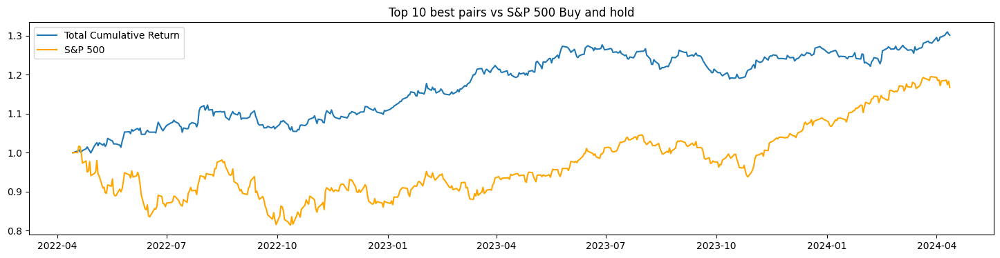

In [86]:
plt.figure(figsize=(18,4))
plt.plot(top_cumret3, label='Total Cumulative Return')
plt.plot(benchmark_cumret_test, color='orange', label='S&P 500')
plt.title('Top 10 best pairs vs S&P 500 Buy and hold')
plt.legend()
plt.show()

In [87]:
results_df.loc['Cointegration (top10 pairs)'] = calculate_metrics(top_cumret3)
results_df

,Total return,APR,Sharpe,MaxDD,MaxDDD
PCA-DBSCAN Srategy,-0.044887,-0.022835,-0.125597,-0.195035,422.0
Simple Distance (top10 pairs),-0.143987,-0.075221,-0.707792,-0.216489,247.0
Cointegration (top10 pairs),0.301063,0.141541,1.441416,-0.068660,183.0


In [88]:
# save returns and pairs df
pairs_dfs['coint_f'] = pairs_df
pair_rets['coint_f'] = pair_ret
traded_pairs['coint_f'] = pair_ret.columns

# Strategy 4 - Granger Causality

In [89]:
pairs_df = pairs_dfs['coint_f']

In [90]:
cond1 = (pairs_df['beta'] > 0)
cond2 = (pairs_df['ADF'] == 1)
cond3 = (pairs_df['Johansen'] == 1)
pairs_df[cond1 & cond2 & cond3]

,alpha,beta,Spread SD,ADF,Johansen
AAPL-FAST,-69.487663,3.981443,10.649163,1.0,1.0
ABT-DRI,66.371607,0.393852,5.611908,1.0,1.0
ABT-EMN,61.267869,0.527794,6.789927,1.0,1.0
ABT-HAS,13.837424,1.120571,6.426055,1.0,1.0
ABT-HBAN,64.192188,3.766783,6.393628,1.0,1.0
...,...,...,...,...,...
V-XRAY,119.065354,1.734522,9.578454,1.0,1.0
VNO-XRAY,19.734580,0.399756,3.028523,1.0,1.0
VNO-YUM,21.465282,0.178139,3.446973,1.0,1.0
WEC-XEL,14.477855,1.169007,2.090573,1.0,1.0


In [91]:
granger_df = pairs_df[cond1 & cond2 & cond3].copy()
granger_df['gc12'] = np.zeros(len(granger_df))
granger_df['gc21'] = np.zeros(len(granger_df))
granger_df

,alpha,beta,Spread SD,ADF,Johansen,gc12,gc21
AAPL-FAST,-69.487663,3.981443,10.649163,1.0,1.0,0.0,0.0
ABT-DRI,66.371607,0.393852,5.611908,1.0,1.0,0.0,0.0
ABT-EMN,61.267869,0.527794,6.789927,1.0,1.0,0.0,0.0
ABT-HAS,13.837424,1.120571,6.426055,1.0,1.0,0.0,0.0
ABT-HBAN,64.192188,3.766783,6.393628,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...
V-XRAY,119.065354,1.734522,9.578454,1.0,1.0,0.0,0.0
VNO-XRAY,19.734580,0.399756,3.028523,1.0,1.0,0.0,0.0
VNO-YUM,21.465282,0.178139,3.446973,1.0,1.0,0.0,0.0
WEC-XEL,14.477855,1.169007,2.090573,1.0,1.0,0.0,0.0


In [92]:
from statsmodels.tsa.stattools import grangercausalitytests

maxlag=15

for pair in granger_df.index:
    s1,s2 = parse_pair(pair)
    
    gct12 = grangercausalitytests(prices_train[[s1,s2]], maxlag=maxlag)    
    pvals12 = [gct12[x][0]['ssr_ftest'][1] for x in range(1,maxlag+1)]
    pvals12 = np.array(pvals12)
    if len(pvals12[pvals12<0.05])>0:
        granger_df.loc[pair, ['gc12']] = 1
    
    gct21 = grangercausalitytests(prices_train[[s2,s1]], maxlag=maxlag)    
    pvals21 = [gct21[x][0]['ssr_ftest'][1] for x in range(1,maxlag+1)]
    pvals21 = np.array(pvals21)
    if len(pvals21[pvals21<0.05])>0:
        granger_df.loc[pair, ['gc21']] = 1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.6330 , p=0.0001  , df_denom=502, df_num=1
ssr based chi2 test:   chi2=14.7205 , p=0.0001  , df=1
likelihood ratio test: chi2=14.5100 , p=0.0001  , df=1
parameter F test:         F=14.6330 , p=0.0001  , df_denom=502, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.1719  , p=0.0008  , df_denom=499, df_num=2
ssr based chi2 test:   chi2=14.4874 , p=0.0007  , df=2
likelihood ratio test: chi2=14.2831 , p=0.0008  , df=2
parameter F test:         F=7.1719  , p=0.0008  , df_denom=499, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1076  , p=0.0017  , df_denom=496, df_num=3
ssr based chi2 test:   chi2=15.5390 , p=0.0014  , df=3
likelihood ratio test: chi2=15.3038 , p=0.0016  , df=3
parameter F test:         F=5.1076  , p=0.0017  , df_denom=496, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8928  , p=0.0040  

ssr based F test:         F=0.7636  , p=0.4665  , df_denom=499, df_num=2
ssr based chi2 test:   chi2=1.5424  , p=0.4624  , df=2
likelihood ratio test: chi2=1.5401  , p=0.4630  , df=2
parameter F test:         F=0.7636  , p=0.4665  , df_denom=499, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7132  , p=0.5444  , df_denom=496, df_num=3
ssr based chi2 test:   chi2=2.1699  , p=0.5379  , df=3
likelihood ratio test: chi2=2.1652  , p=0.5388  , df=3
parameter F test:         F=0.7132  , p=0.5444  , df_denom=496, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5141  , p=0.7254  , df_denom=493, df_num=4
ssr based chi2 test:   chi2=2.0937  , p=0.7185  , df=4
likelihood ratio test: chi2=2.0894  , p=0.7193  , df=4
parameter F test:         F=0.5141  , p=0.7254  , df_denom=493, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9894  , p=0.4236  , df_denom=490, df_num=5
ssr based chi2 test: 

In [93]:
cond = ((granger_df['gc12'] == 1) & (granger_df['gc21'] == 1))
granger_df[cond]

,alpha,beta,Spread SD,ADF,Johansen,gc12,gc21
ABT-DRI,66.371607,0.393852,5.611908,1.0,1.0,1.0,1.0
ABT-HAS,13.837424,1.120571,6.426055,1.0,1.0,1.0,1.0
ABT-IR,59.539341,1.209857,4.528558,1.0,1.0,1.0,1.0
ABT-NSC,42.819042,0.293397,5.634834,1.0,1.0,1.0,1.0
ABT-TJX,24.402070,1.417069,6.087723,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...
STT-VNO,-4.408577,2.023998,8.975450,1.0,1.0,1.0,1.0
SYY-VNO,4.824078,1.631086,7.448132,1.0,1.0,1.0,1.0
USB-VNO,-21.743816,1.736423,5.775554,1.0,1.0,1.0,1.0
VNO-XRAY,19.734580,0.399756,3.028523,1.0,1.0,1.0,1.0


In [94]:
potential_pairs = granger_df[cond].index

In [95]:
# calculate in-sample Sharpe ratios for all cointegrated pairs
insample_sharpe = pd.DataFrame(index=potential_pairs, columns=['Sharpe'])

for pair in insample_sharpe.index:
    s1,s2 = parse_pair(pair)
    
    # construct spread
    alpha, beta, sd = pairs_df.loc[pair, ['alpha', 'beta', 'Spread SD']]
    spread = prices_train[s1] - alpha - beta * prices_train[s2]
    
    positions = pd.DataFrame(index=spread.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    positions.ffill(inplace=True)
    positions.fillna(0, inplace=True)
    
    ret = (positions.shift() * returns_train[[s1,s2]]).sum(axis=1)
    insample_sharpe.loc[pair] = np.sqrt(252) * np.nanmean(ret) / np.nanstd(ret)

In [96]:
insample_sharpe.sort_values(by=['Sharpe'], ascending=False)

,Sharpe
LH-TXT,3.584174
LRCX-MCHP,3.295722
ACN-DGX,3.139169
HUM-SHW,3.099985
MCHP-TJX,3.062511
...,...
BXP-TXT,0.926278
BXP-FITB,0.80291
PPL-ROK,0.766917
EBAY-GME,0.725101


In [97]:
insample_sharpe = insample_sharpe.sort_values(by=['Sharpe'], ascending=False)

In [98]:
potential_pairs = insample_sharpe[insample_sharpe['Sharpe']>1].sort_values(by=['Sharpe'], ascending=False).index
len(potential_pairs)

161

In [99]:
pair_ret = pd.DataFrame(index=returns_test.index, columns=potential_pairs)

for pair in tqdm(potential_pairs):
    s1,s2 = parse_pair(pair)
    
    # construct spread
    alpha,beta,sd = pairs_df.loc[pair, ['alpha', 'beta', 'Spread SD']]
    spread = prices_test[s1] - alpha - beta * prices_test[s2]
    
    positions = pd.DataFrame(index=returns_test.index, columns=[s1,s2])
    
    # indicators of long\short positions
    short = False
    long = False
    
    for t in spread.index:
        if spread.loc[t] > 1.5*sd:
            short = True
            positions.loc[t] = [-1,1] # open short position
        elif spread.loc[t] < -1.5*sd:
            long = True
            positions.loc[t] = [1,-1] # open long position
        elif short and spread.loc[t] < 0:
            short = False
            positions.loc[t] = [0,0] # close short position
        elif long and spread.loc[t] > 0:
            long = False
            positions.loc[t] = [0,0] # close long position
    positions.ffill(inplace=True)
    positions.fillna(0, inplace=True)
    
    ret = (positions.shift() * returns_test[[s1,s2]]).sum(axis=1)
    
    pair_ret[pair] = ret

  7%|▋         | 12/161 [00:00<00:03, 45.32it/s]

100%|██████████| 161/161 [00:02<00:00, 55.27it/s]


In [100]:
pair_cumret = (1 + pair_ret).cumprod()
pair_cumret

,LH-TXT,LRCX-MCHP,ACN-DGX,HUM-SHW,MCHP-TJX,DRI-R,HAS-TJX,R-TJX,LH-NTRS,BIG-GPS,...,FAST-HUM,CMCSA-FOSL,AKAM-LOW,CMCSA-PBI,MTB-VNO,EA-NWL,EA-SRCL,MA-MCHP,AKAM-FAST,PBI-URBN
2022-04-14,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2022-04-18,1.0,1.0,1.0,0.987697,1.0,0.996883,1.0,1.0,1.0,1.0,...,1.0,1.0,0.982506,1.0,1.0,0.992395,1.0,1.0,1.0,1.0
2022-04-19,1.0,1.0,1.0,1.001823,1.0,1.006789,1.0,1.0,1.0,1.0,...,1.0,1.0,0.989247,1.0,1.0,0.991348,1.0,1.0,1.01594,1.0
2022-04-20,1.0,1.0,1.0,0.990307,1.0,1.017125,1.0,1.0,1.0,1.0,...,1.0,1.0,1.01229,1.0,1.0,0.970776,1.0,1.0,1.016817,1.0
2022-04-21,1.0,1.0,1.0,1.004876,1.0,1.012041,1.0,1.0,1.0,1.0,...,1.0,1.0,1.010572,1.0,0.987087,0.967887,1.0,1.0,1.045468,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-08,0.606588,1.054568,1.156065,0.876261,1.088166,1.307473,0.475005,1.483972,0.921803,0.055998,...,0.733166,0.799865,1.371455,1.12101,0.841767,2.21573,2.460735,1.29662,1.160375,0.586967
2024-04-09,0.610576,1.077749,1.170924,0.87757,1.109087,1.298122,0.468566,1.484645,0.923262,0.055361,...,0.739129,0.827026,1.371455,1.12101,0.873903,2.251556,2.438632,1.351387,1.179412,0.655879
2024-04-10,0.606452,1.048614,1.196142,0.911459,1.07514,1.333301,0.468027,1.434347,0.907528,0.055973,...,0.749384,0.794942,1.371455,1.12101,0.841157,2.19266,2.399249,1.307168,1.162462,0.637256
2024-04-11,0.610959,1.038965,1.178689,0.906753,1.094354,1.315467,0.465536,1.451602,0.905362,0.052993,...,0.791351,0.778255,1.390731,1.12101,0.869333,2.212644,2.393819,1.327223,1.245958,0.619944


In [101]:
# fraction of pairs with positive returns
(pair_cumret.iloc[-1] > 1).sum() / pair_cumret.shape[1]

0.35403726708074534

In [102]:
# fraction of pairs with no positions
(pair_cumret.iloc[-1] == 1).sum() / pair_cumret.shape[1]

0.0

In [103]:
total_ret = pair_ret.sum(axis=1) / len(pair_ret.columns)

In [104]:
selected_pairs = []
selected_stocks = []

# pairs opened on first trading days
for i in range(len(pair_cumret.index)):
    idx = pair_cumret.iloc[i][pair_cumret.iloc[i]!=1].index # pairs opened on day i
    # sort by Sharpe ratio and start selecting
    for pair in insample_sharpe.loc[idx].sort_values(by='Sharpe', ascending=False).index:
        s1,s2 = parse_pair(pair)
        if (s1 not in selected_stocks) and (s2 not in selected_stocks):
            selected_pairs.append(pair)
            selected_stocks.extend([s1,s2])
        if len(selected_pairs)==10:
            break
    if len(selected_pairs)==10:
            break

In [105]:
insample_sharpe.loc[selected_pairs]

,Sharpe
HUM-SHW,3.099985
DRI-R,3.053865
DOV-YUM,2.66525
LH-STT,2.628964
ABT-WY,2.539132
DOW-HOG,2.43769
AES-HAS,2.412957
GME-LEN,2.201121
PHM-UPS,1.968757
EL-ETN,1.959729


In [106]:
results4 = calculate_metrics2(selected_pairs, cumret_train)
results4

,CADF p-value,ADF p-value,Spread SD,Num zero-crossings,Hurst Exponent,Half-life of mean reversion,% days within 2-SD band
HUM-SHW,0.012013,0.40811,0.221309,5,0.569588,75.354284,70.55336
DRI-R,0.003783,0.027743,0.193498,24,0.403559,19.780485,86.956522
DOV-YUM,0.000123,0.351976,0.133523,9,0.520299,54.851872,68.577075
LH-STT,0.003173,0.030381,0.15618,2,0.406287,22.109413,39.525692
ABT-WY,0.0136,0.163973,0.183323,5,0.519768,37.397277,50.395257
DOW-HOG,0.009974,0.01832,0.179159,4,0.424395,16.03525,70.948617
AES-HAS,0.014901,0.323823,0.220208,13,0.53226,54.011465,61.462451
GME-LEN,0.007975,0.337116,14.015754,5,0.384623,27.606057,76.482213
PHM-UPS,0.085471,0.171304,0.182177,36,0.415717,22.783336,94.268775
EL-ETN,0.014156,0.026404,0.090354,43,0.350855,13.979673,91.897233


In [107]:
top_ret = pair_ret[selected_pairs].sum(axis=1) / len(selected_pairs)
top_cumret4 = (1 + top_ret).cumprod()

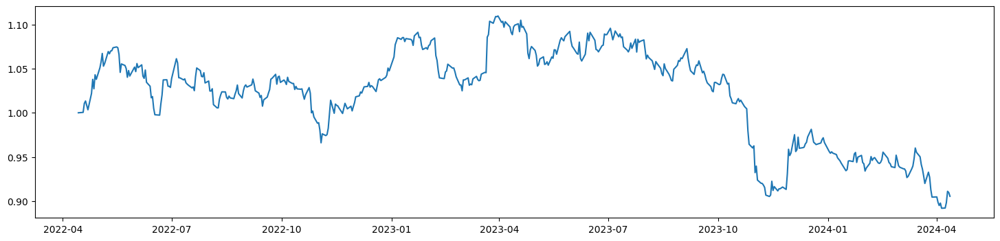

In [108]:
plt.figure(figsize=(18,4))
plt.plot(top_cumret4)

In [109]:
results_df.loc['Granger Causality'] = calculate_metrics(top_cumret4)
results_df

,Total return,APR,Sharpe,MaxDD,MaxDDD
PCA-DBSCAN Srategy,-0.044887,-0.022835,-0.125597,-0.195035,422.0
Simple Distance (top10 pairs),-0.143987,-0.075221,-0.707792,-0.216489,247.0
Cointegration (top10 pairs),0.301063,0.141541,1.441416,-0.068660,183.0
Granger Causality,-0.094504,-0.048707,-0.354959,-0.196099,259.0


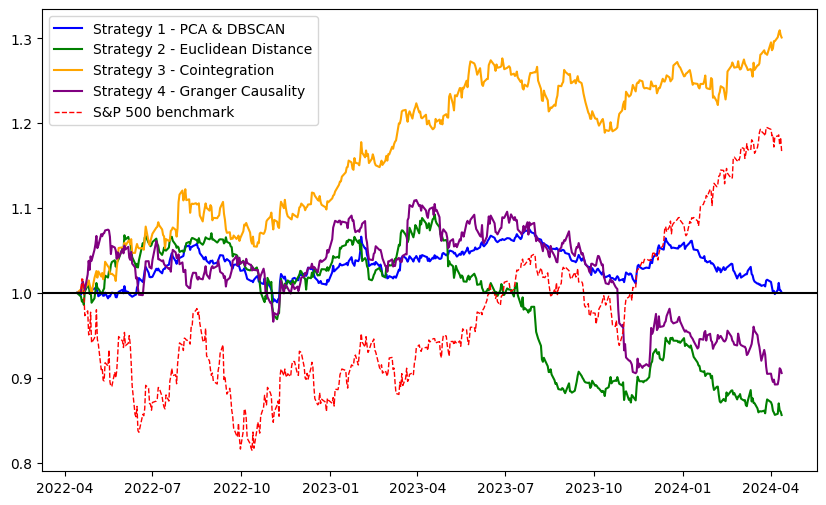

In [110]:
plt.figure(figsize=(10, 6))  # Change the size of the plot

plt.plot(total_cumret, color='blue', label='Strategy 1 - PCA & DBSCAN')
plt.plot(top_cumret2, color='green', label='Strategy 2 - Euclidean Distance')
plt.plot(top_cumret3, color='orange', label='Strategy 3 - Cointegration')
plt.plot(top_cumret4, color='purple', label='Strategy 4 - Granger Causality')
plt.plot(benchmark_cumret_test, color='red', linewidth=1, linestyle='--', label='S&P 500 benchmark')

plt.axhline(y=1, color='black' )  # Add horizontal line at y=1.00

plt.legend()  # Display the legend
plt.show()  # Display the plot